# **Person Anonymization using Computer Vision - Phase 1**

## WIDERFACE Dataset

#### Mahdis Saharkhizan


__________

# 0. Mount Google Drive

In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

ref_path = "/content/drive/MyDrive/Colab Notebooks/Person Anonymization"



%cd "/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7"

Mounted at /content/drive
/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7


In [ ]:
# drive.flush_and_unmount()

# 1. Prepare the environment


## 1.1. Install the dependencies

In [ ]:
# Download YOLOv7 repository and install requirements

%cd "/content/drive/MyDrive/Colab Notebooks/Person Anonymization"
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

## 1.2. Import the necessary libraries

In [2]:
from base64 import b64encode
import csv
import glob
import pathlib
import pickle
import requests
import shutil
import subprocess
import re
import os
import zipfile
from typing_extensions import TypedDict
import struct
import imghdr
from typing import Union, Optional, Any, Tuple, List, Dict

import IPython.display
from IPython.display import display
from IPython.display import HTML

import numpy as np
import gdown
from PIL import Image
# import py7zr
from tqdm import tqdm
import imagesize
# from kora.drive import upload_public

# 2. Test Pre-trained Model

## 2.1. Download official pre-trained models

In [ ]:
!wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7_training.pt
!wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt

In [ ]:
if not pathlib.Path("yolov7.pt").is_file():
    print("yolov7.pt not found, starting to download...")
    r = requests.get(
        url="https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt",
        verify=False,
        stream=True
    )
    r.raw.decode_content = True
    with open("yolov7.pt", 'wb') as f:
        shutil.copyfileobj(r.raw, f)
else:
    print("yolov7.pt already exists")

yolov7.pt already exists


## 2.2. Inference on a single image

Test the original pre-trained model on a single image:

In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7"

/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp_test', no_trace=True, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='inference/images/bus.jpg', update=False, view_img=False, weights=['yolov7.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36905341 parameters, 6652669 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
4 persons, 1 bus, 1 tie, Done. (18.4ms) Inference, (1.3ms) NMS
 The image with the result is saved in: runs/detect/exp_test/bus.jpg
Do

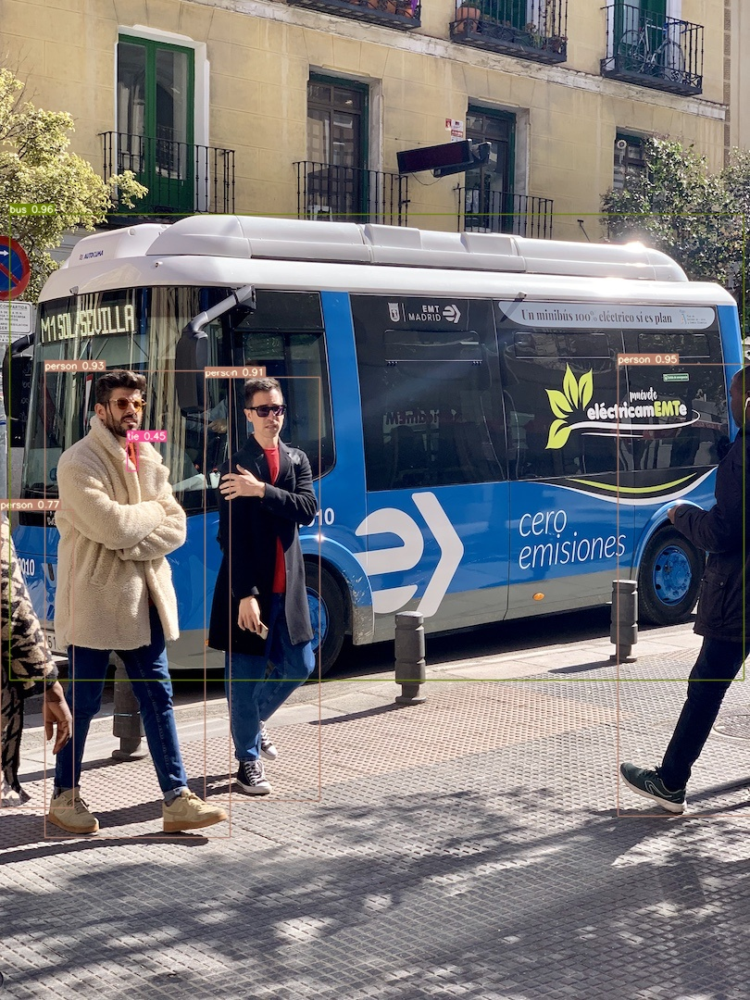

In [ ]:
!python detect.py --weights yolov7.pt --no-trace --name exp_test --source inference/images/bus.jpg

display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp_test/bus.jpg", width=640))

# 3. Prepare Training Data

## 3.1. Unzip WIDER FACE Data in the Correct Directories

In [ ]:
for set_name in ["train", "test", "val"]:
    if pathlib.Path(f"{ref_path}/yolov7/{set_name}/WIDER_{set_name}").is_dir():
        continue
    print(f"Extracting data for {set_name} set...")
    zip_ref = zipfile.ZipFile(f"{ref_path}/yolov7/{set_name}/WIDER_{set_name}.zip", 'r')
    zip_ref.extractall(f"{ref_path}/yolov7/{set_name}")
    zip_ref.close()

Extracting data for val set...


In [ ]:
for set_name in ["train", "test", "val"]:
    images_dir = f"{ref_path}/yolov7/{set_name}/WIDER_{set_name}/images"
    list_images = []
    for root, dirs, files in os.walk(f"{ref_path}/yolov7/{set_name}/WIDER_{set_name}/images"):
        for file in files:
            if file.endswith(".jpg"):
                shutil.copyfile(os.path.join(root, file), f"{ref_path}/yolov7/{set_name}/images/{file}")

## 3.2. Create Labels

In [ ]:
for set_name in ["train", "val"]:
    file_name = f"{ref_path}/yolov7/{set_name}/wider_face_{set_name}_bbx_gt.txt"
    with open(file_name, 'r') as f:
        wf_labels = f.readlines()

    labels_dir = f"{ref_path}/yolov7/{set_name}/labels"
    
    yolo_labels, label_file_name = [], None
    img_file_path, img_width, img_height = None, None, None
    for i, line in enumerate(wf_labels):
        if ".jpg" in line:
            # Save labels for previous image
            if label_file_name is not None:
                with open(f"{labels_dir}/{label_file_name}", 'w') as f:
                    for y_label in yolo_labels:
                        f.write(f"{y_label}\n")

            # Empty YOLO labels list
            yolo_labels = []

            # Set label file name
            label_file_name = line.replace('\n', '').split('/')[1].replace(".jpg", ".txt")
            
            # Find image width and height
            img_file_path = f"{ref_path}/yolov7/{set_name}/WIDER_{set_name}/images/" + line.replace('\n', '')
            img = Image.open(img_file_path)
            img_width, img_height = img.width, img.height
        elif len(line.split(" ")) > 1:
            # Normalize bbox values and add them to YOLO labels list
            x, y, w, h = line.split(" ")[:4]
            x, y, w, h = int(x), int(y), int(w), int(h)
            yolo_labels.append(
                "0 {:.6} {:.6} {:.6} {:.6}".format((x + w/2)/img_width, (y + h/2)/img_height, w/img_width, h/img_height)
            )
        else:
            continue
        
    # Save labels for the last image
    with open(f"{labels_dir}/{label_file_name}", 'w') as f:
        for y_label in yolo_labels:
            f.write(f"{y_label}\n")

## 3.3. Count the number of images

In [ ]:
import glob

create_image_list = True

for set_name in ["train", "test", "val"]:
    list_images = []
    for root, dirs, files in os.walk(f"{ref_path}/yolov7/{set_name}/images"):
        for file in files:
            if file.endswith(".jpg"):
                list_images.append(os.path.join(root, file))
    
    if create_image_list:
        with open(f"{ref_path}/yolov7/{set_name}/{set_name}.txt", 'w') as f:
            for img_dir in list_images:
                f.write(f"{img_dir}\n")

    print(f"Number of {set_name} images:", len(list_images))
    labels_dir = f"{ref_path}/yolov7/{set_name}/labels"
    print(f"Number of {set_name} labels:", len(glob.glob1(labels_dir, "*.txt")))


Number of train images: 12880
Number of train labels: 12880
Number of test images: 16097
Number of test labels: 0
Number of val images: 3226
Number of val labels: 3226


# 4. Training

In [ ]:
# %cd /content/yolov7
# !python train.py --batch 16 --epochs 55 --data {dataset.location}/data.yaml --weights 'yolov7_training.pt' --device 0 


In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7"

/content/drive/MyDrive/Colab Notebooks/Person Anonymization/yolov7


In [ ]:
# import torch


# torch.cuda.empty_cache()

Trace: **yolov7**

In [ ]:
!python train.py --weights yolov7.pt --data data/widerface.yaml --workers 8 --batch-size 16 --epochs 25 --cfg cfg/training/yolov7.yaml --name yolov7 --hyp data/hyp.scratch.p5.yaml


YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='data/widerface.yaml', device='', entity=None, epochs=25, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov7', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov7', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2022-10-21 18:04:11.917350: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slight

Trace: **yolov739** (metrics didn't improve over epochs)

In [ ]:
!python train.py --weights runs/train/yolov7/weights/best.pt --data data/widerface.yaml --workers 8 --batch-size 32 --epochs 30 --cfg cfg/training/yolov7.yaml --name yolov7 --hyp data/hyp.scratch.p5.yaml


YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=32, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='data/widerface.yaml', device='', entity=None, epochs=30, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov7', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov739', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=32, upload_dataset=False, v5_metric=False, weights='runs/train/yolov7/weights/best.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2022-10-21 21:18:32.157218: I tensorflow/core/util/util.cc:169] oneDNN custom operations 

Trace: **yolov740** (metrics didn't improve over epochs)

In [ ]:
!python train.py --weights runs/train/yolov7/weights/best.pt --data data/widerface.yaml --workers 8 --batch-size 16 --epochs 30 --cfg cfg/training/yolov7.yaml --name yolov7 --hyp data/hyp.scratch.p5.yaml


YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='data/widerface.yaml', device='', entity=None, epochs=30, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov7', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov740', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, v5_metric=False, weights='runs/train/yolov7/weights/best.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2022-10-21 21:47:07.182377: I tensorflow/core/util/util.cc:169] oneDNN custom operations 

## Trace: **yolov750**


**(BEST MODEL SO FAR)**

In [ ]:
!python train.py --weights yolov7.pt --data data/widerface.yaml --workers 8 --batch-size 32 --epochs 60 --cfg cfg/training/yolov7.yaml --name yolov750 --hyp data/hyp.scratch.p5.yaml


YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=32, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='data/widerface.yaml', device='', entity=None, epochs=60, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov750', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov750', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=32, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2022-10-21 22:09:53.908788: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see sl

# 5. Evaluation

In [3]:
import os
import pathlib
import imp

import yaml

test = imp.load_source('test', 'test.py')
from models.experimental import attempt_load
from utils.datasets import create_dataloader
from utils.torch_utils import select_device


def evaluate_model(weights: str, cfg: str, save_dir: str, img_paths: str, img_size: int = 640,
                   batch_size: int = 25, conf_thres: float = 0.2, iou_thres: float = 0.45,
                   device: str = '0'):
    
    with open(cfg) as f:
        data_dict = yaml.load(f, Loader=yaml.SafeLoader)

    device = select_device(device, batch_size=batch_size)
    model = attempt_load(weights, device).half()
    gs = max(int(model.stride.max()), 32)

    class OPT:
        single_cls = False
    opt = OPT()

    testloader = create_dataloader(img_paths, img_size, batch_size * 2, gs, opt,
                                   rect=True, rank=-1, pad=0.5)[0]

    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
        os.makedirs(os.path.join(save_dir, 'labels'))
    else:
        if not os.path.isdir(os.path.join(save_dir, 'labels')):
            os.makedirs(os.path.join(save_dir, 'labels'))

    results, maps, times = test.test(
        data_dict,
        batch_size=batch_size * 2,
        imgsz=img_size,
        conf_thres=conf_thres,
        iou_thres=iou_thres,
        model=model,
        single_cls=False,
        dataloader=testloader,
        save_dir=pathlib.Path(save_dir),
        verbose=True,
        plots=True,
        save_txt=True
    )

## 5.1. Training trace **yolov7**

Weights: runs/train/yolov7/weights/best.pt

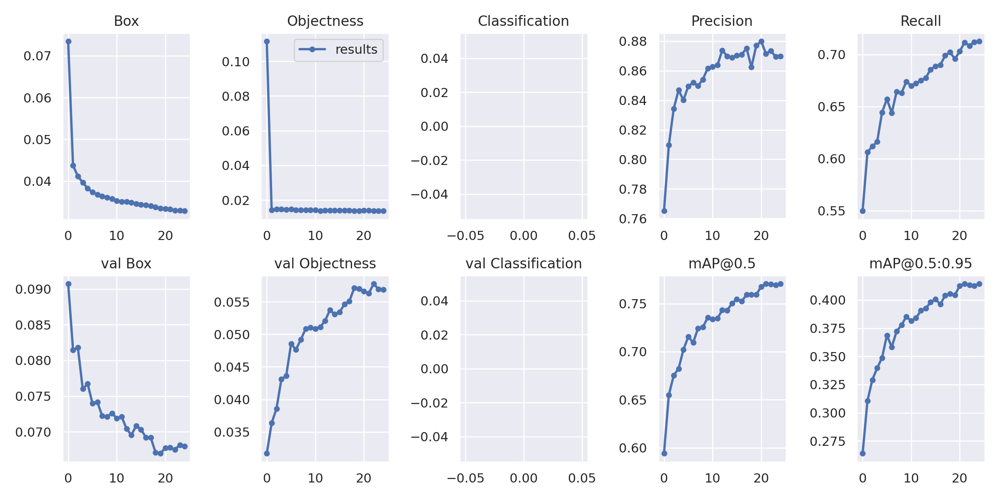

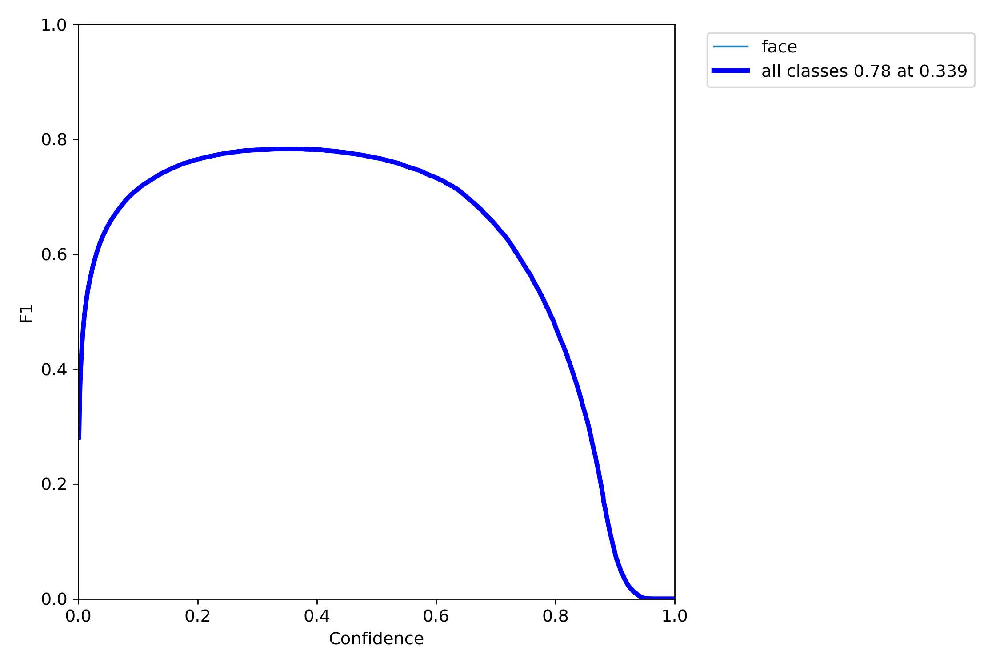

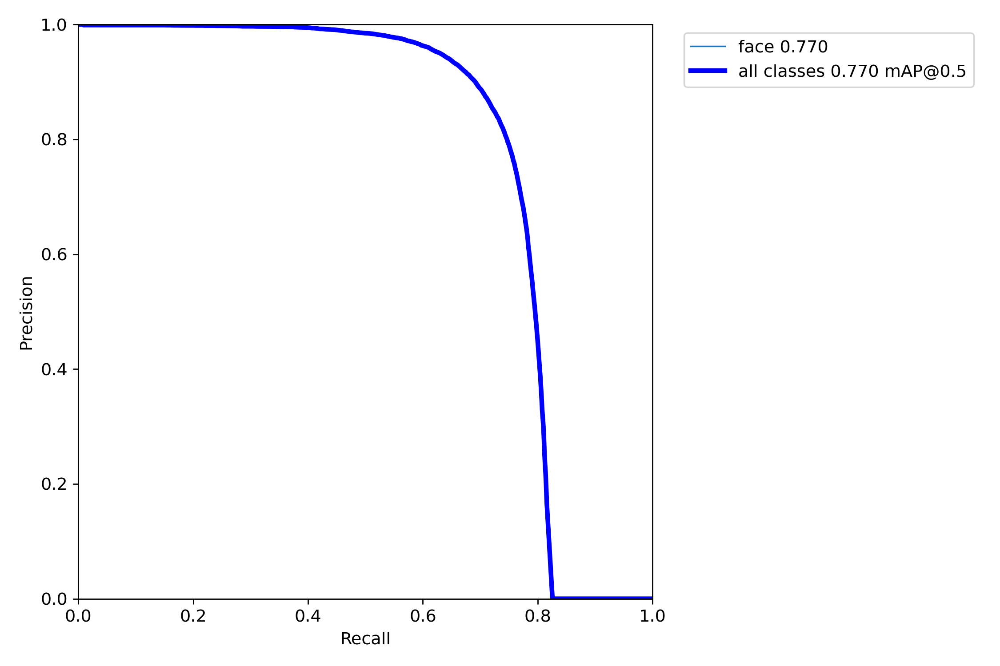

In [ ]:
display(IPython.display.Image(f"{ref_path}/yolov7/runs/train/yolov7/results.png", width=800))

display(IPython.display.Image(f"{ref_path}/yolov7/runs/train/yolov7/F1_curve.png", width=500))

display(IPython.display.Image(f"{ref_path}/yolov7/runs/train/yolov7/PR_curve.png", width=500))


## 5.2. Training trace **yolov750** (Best Model)

Weights: runs/train/yolov750/weights/best.pt

### **Training set**

In [4]:
evaluate_model(weights='runs/train/yolov750/weights/best.pt', cfg='data/widerface.yaml',
               img_paths='train/train.txt', save_dir='runs/test/yolov750_train_evaluation',
               batch_size=10, device='0')

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


Scanning 'train/train.cache' images and labels... 12880 found, 0 missing, 5 empty, 4 corrupted: 100%|██████████| 12880/12880 [00:00<?, ?it/s]
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95:   0%|          | 0/644 [00:00<?, ?it/s]/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 644/644 [59:41<00:00,  5.56s/it]


                 all       12876      158230       0.887       0.742       0.765       0.445


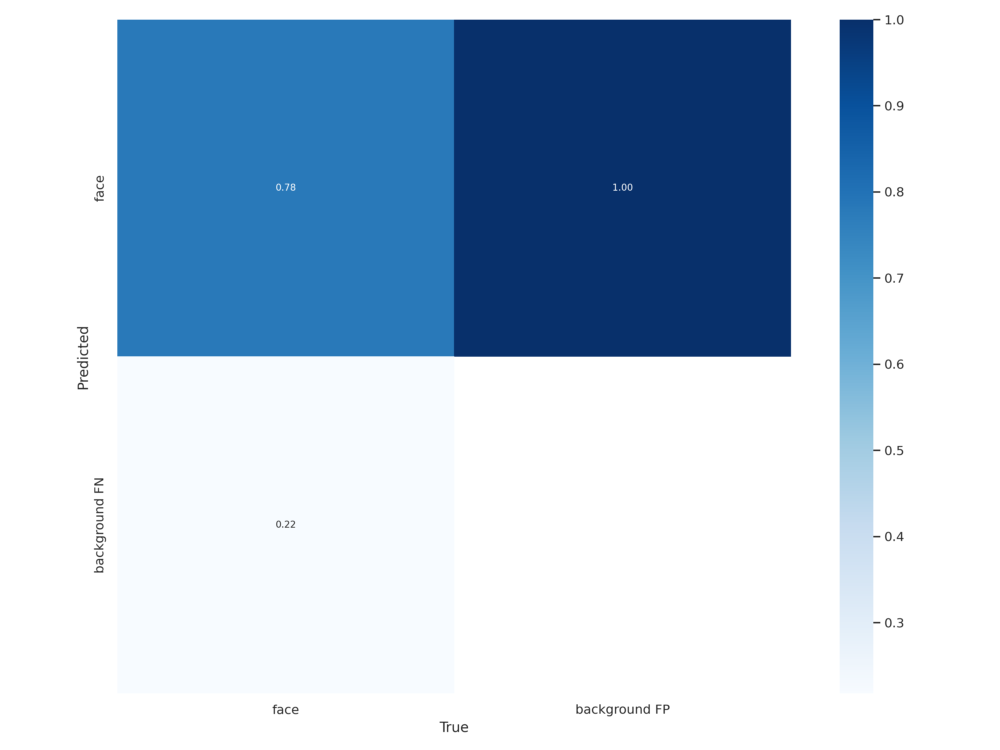

In [6]:
display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_train_evaluation/confusion_matrix.png", width=650))


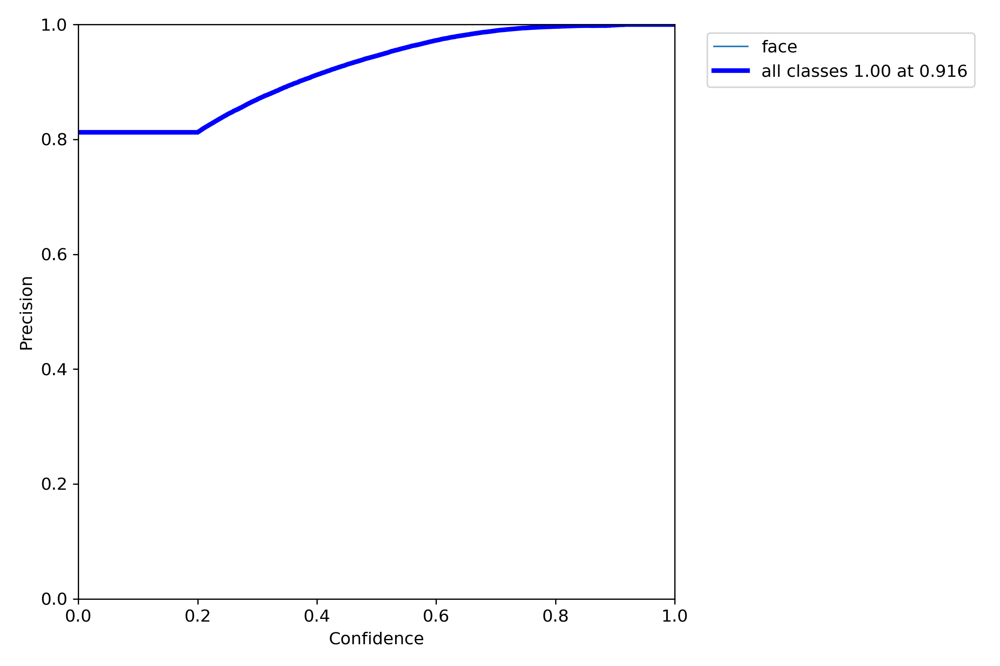

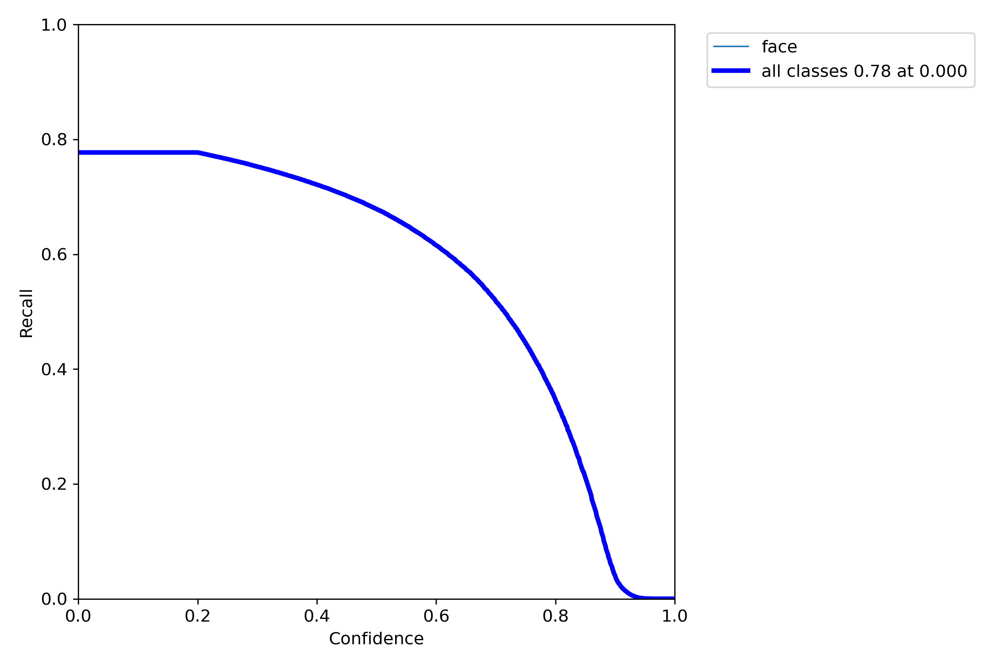

In [7]:
display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_train_evaluation/P_curve.png", width=600))
print('\n')

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_train_evaluation/R_curve.png", width=600))
print('\n')

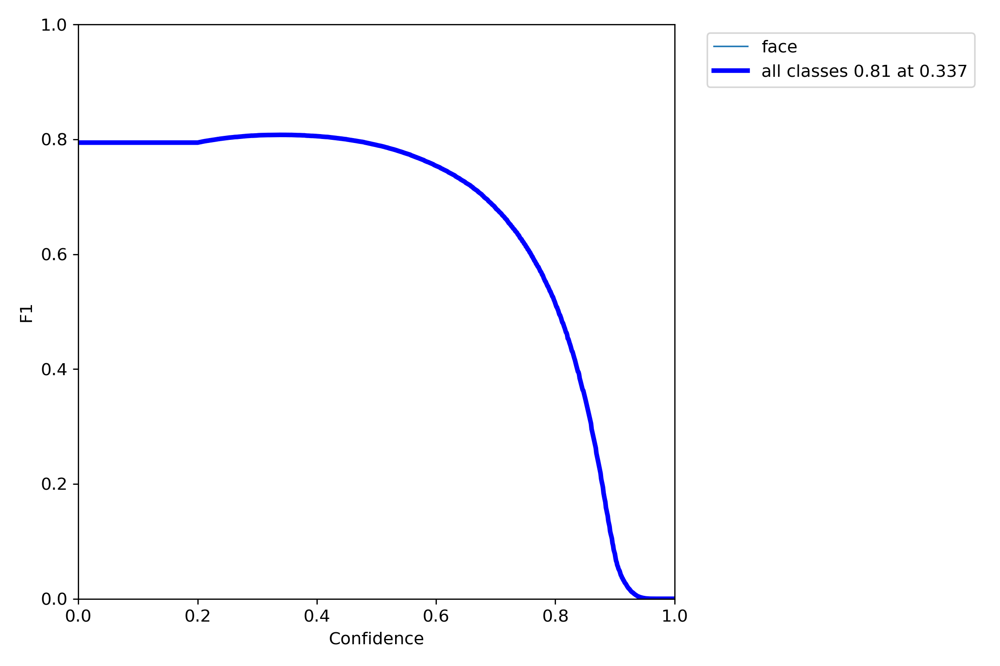

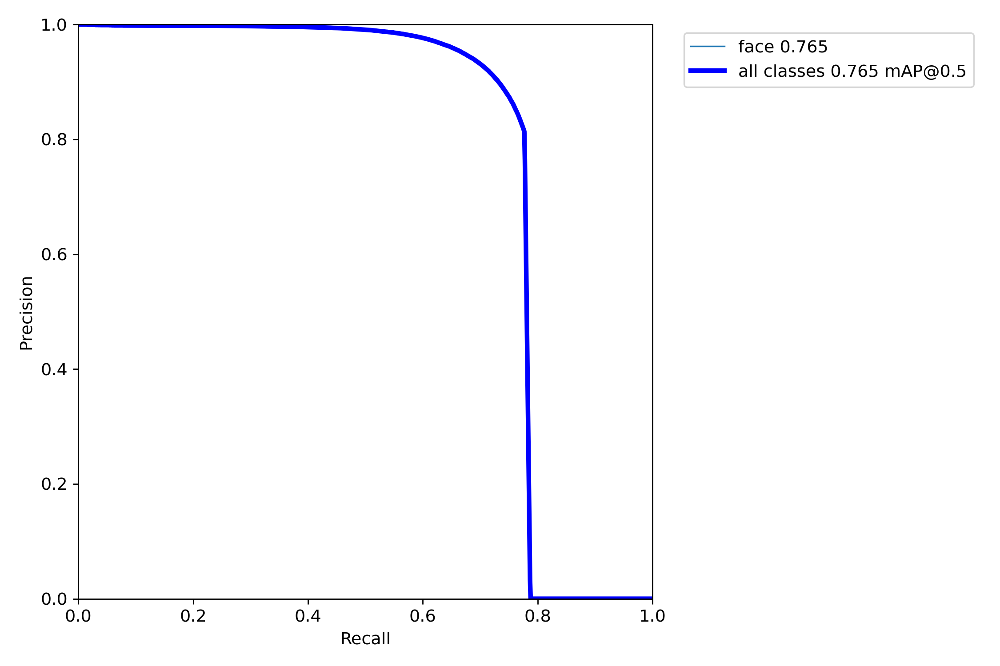

In [8]:

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_train_evaluation/F1_curve.png", width=600))
print('\n')

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_train_evaluation/PR_curve.png", width=600))
print('\n')

### **Validation set**

In [12]:
evaluate_model(weights='runs/train/yolov750/weights/best.pt', cfg='data/widerface.yaml',
               img_paths='val/val.txt', save_dir='runs/test/yolov750_validation_evaluation',
               batch_size=10, device='0')

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


Scanning 'val/val.cache' images and labels... 3226 found, 0 missing, 0 empty, 2 corrupted: 100%|██████████| 3226/3226 [00:00<?, ?it/s]
               Class      Images      Labels           P           R      mAP@.5  mAP@.5:.95: 100%|██████████| 162/162 [08:57<00:00,  3.32s/it]


                 all        3224       39560       0.886       0.719       0.746       0.416


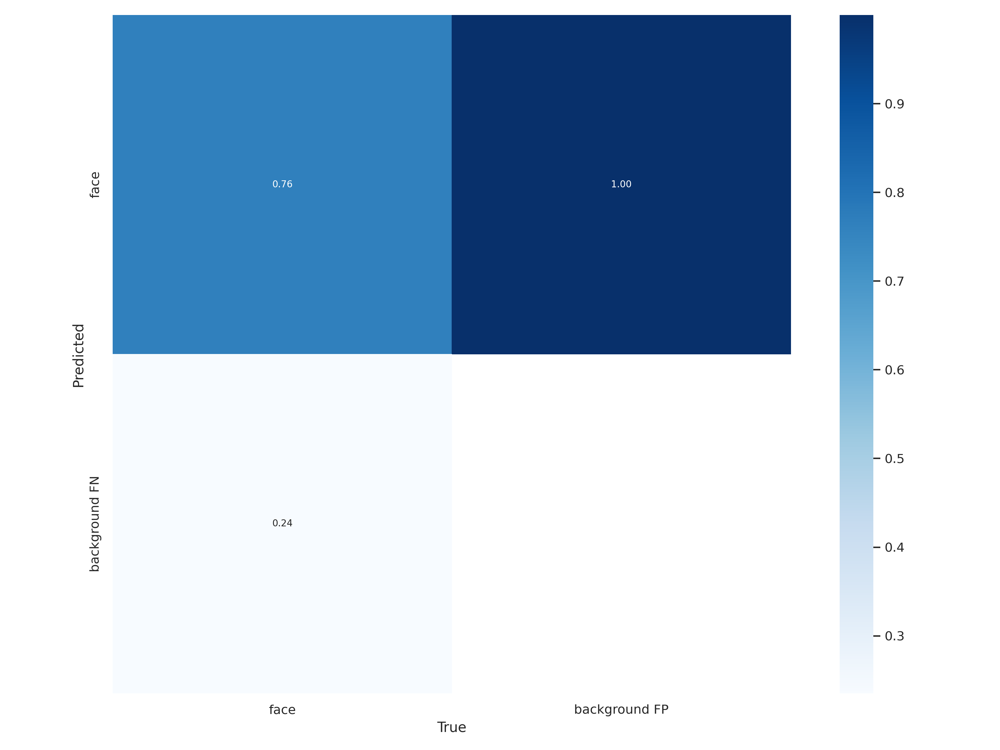

In [13]:
display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_validation_evaluation/confusion_matrix.png", width=650))
print('\n')


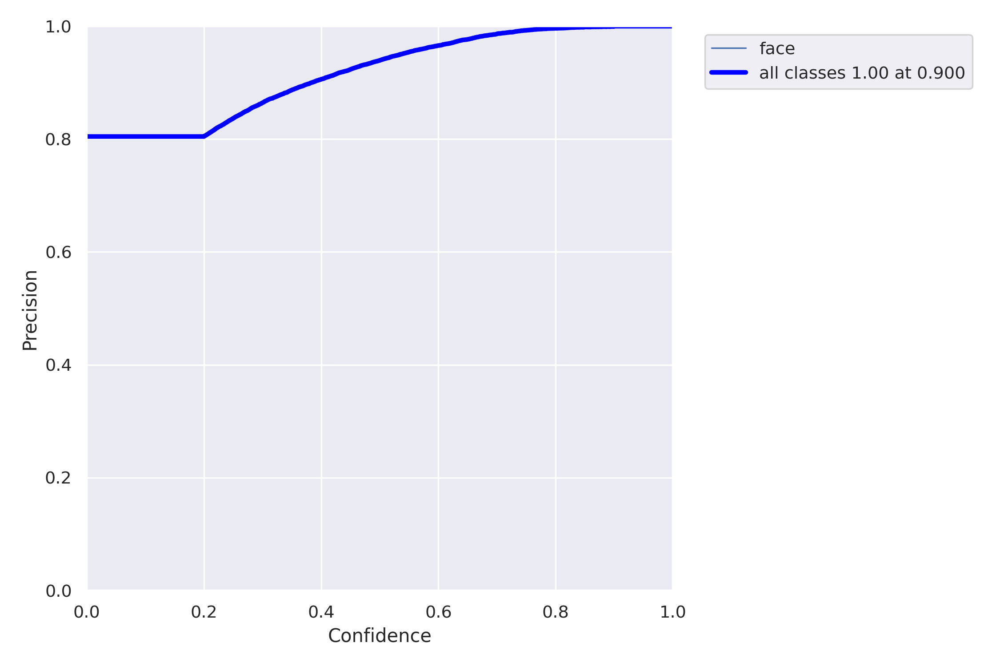

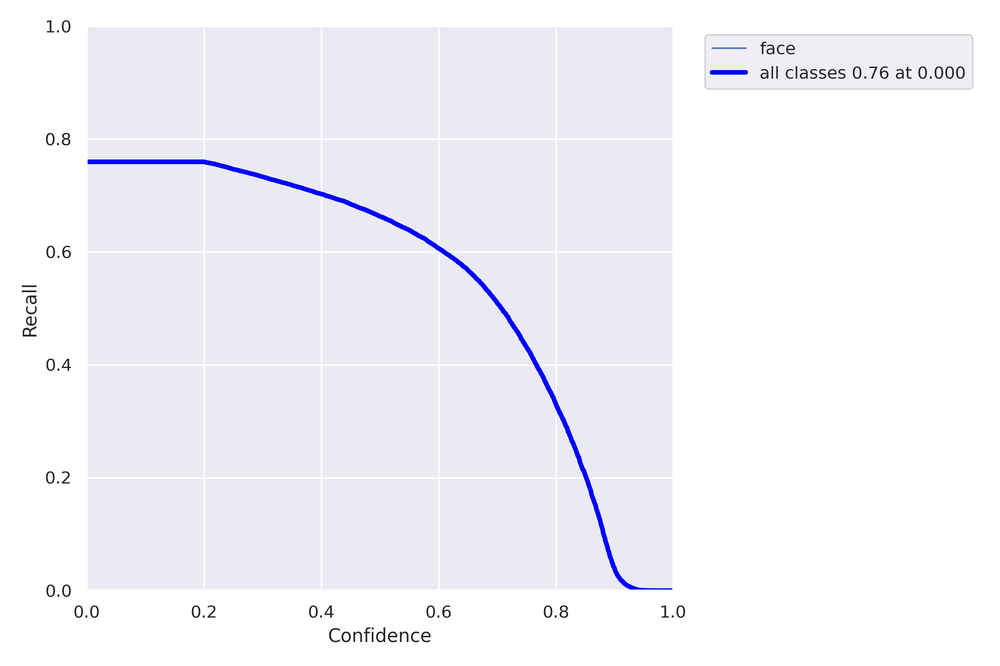

In [14]:
display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_validation_evaluation/P_curve.png", width=600))
print('\n')

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_validation_evaluation/R_curve.png", width=600))
print('\n')

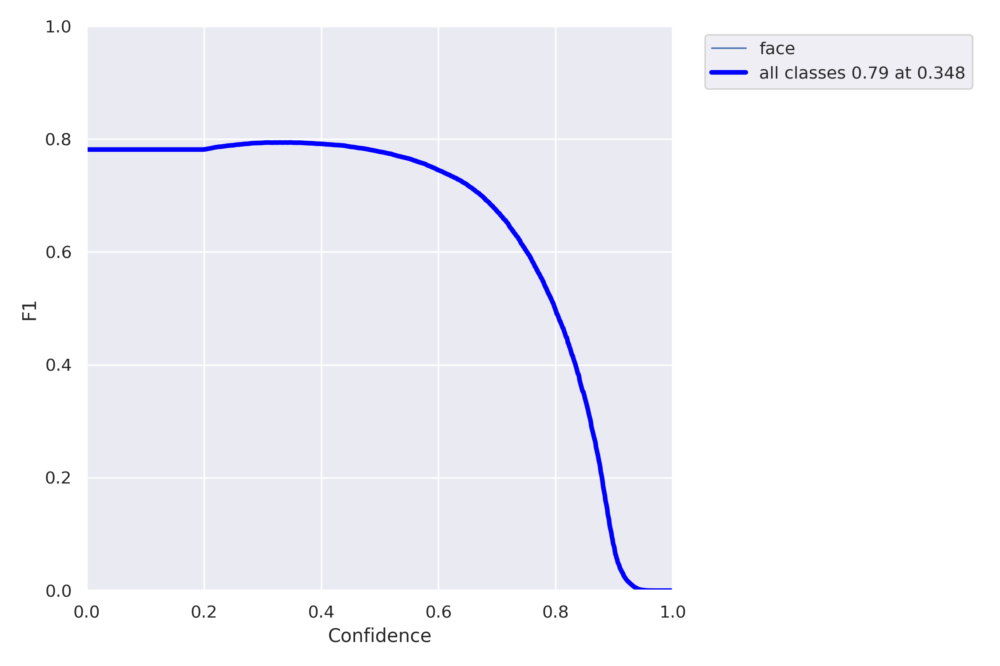

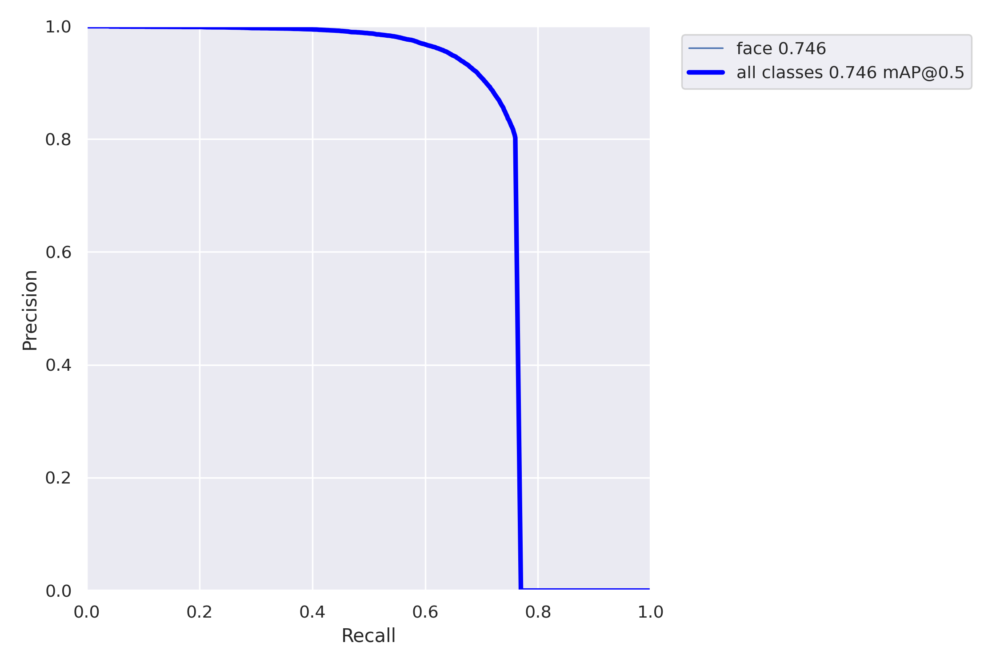

In [15]:

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_validation_evaluation/F1_curve.png", width=600))
print('\n')

display(IPython.display.Image(f"{ref_path}/yolov7/runs/test/yolov750_validation_evaluation/PR_curve.png", width=600))
print('\n')

## 5.2. Evaluate face detection on some test images

### 5.2.1. Test image 1 (one person-close to the camera)

In [ ]:
!python detect.py --weights runs/train/yolov7/weights/best.pt --conf 0.1 --no-trace --source "test/images/61_Street_Battle_streetfight_61_912.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='', no_trace=True, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='test/images/61_Street_Battle_streetfight_61_912.jpg', update=False, view_img=False, weights=['runs/train/yolov7/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
1 face, Done. (21.7ms) Inference, (1.4ms) NMS
 The image with the result is sav

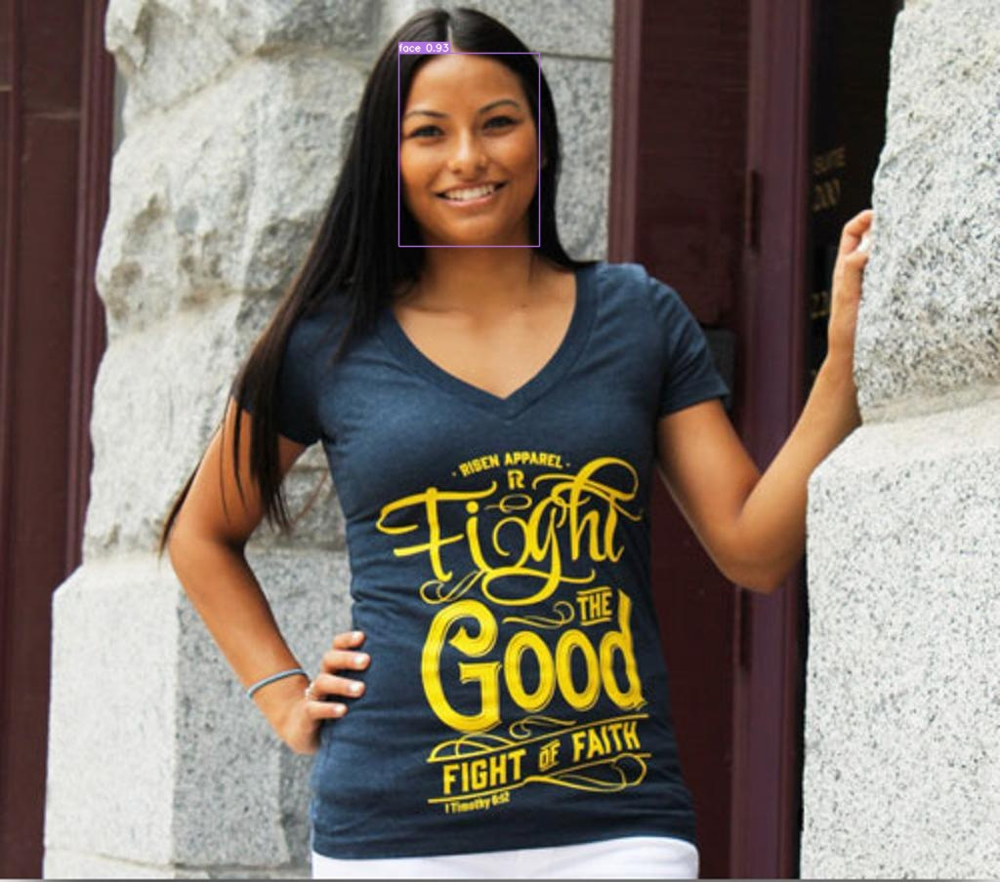

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp7/61_Street_Battle_streetfight_61_912.jpg", width=640))

### 5.2.2. Test image 2 (many faces, crowded room, away from the camera)

In [ ]:
!python detect.py --weights runs/train/yolov7/weights/best.pt --conf 0.1 --source "test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_474.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_474.jpg', update=False, view_img=False, weights=['runs/train/yolov7/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # 

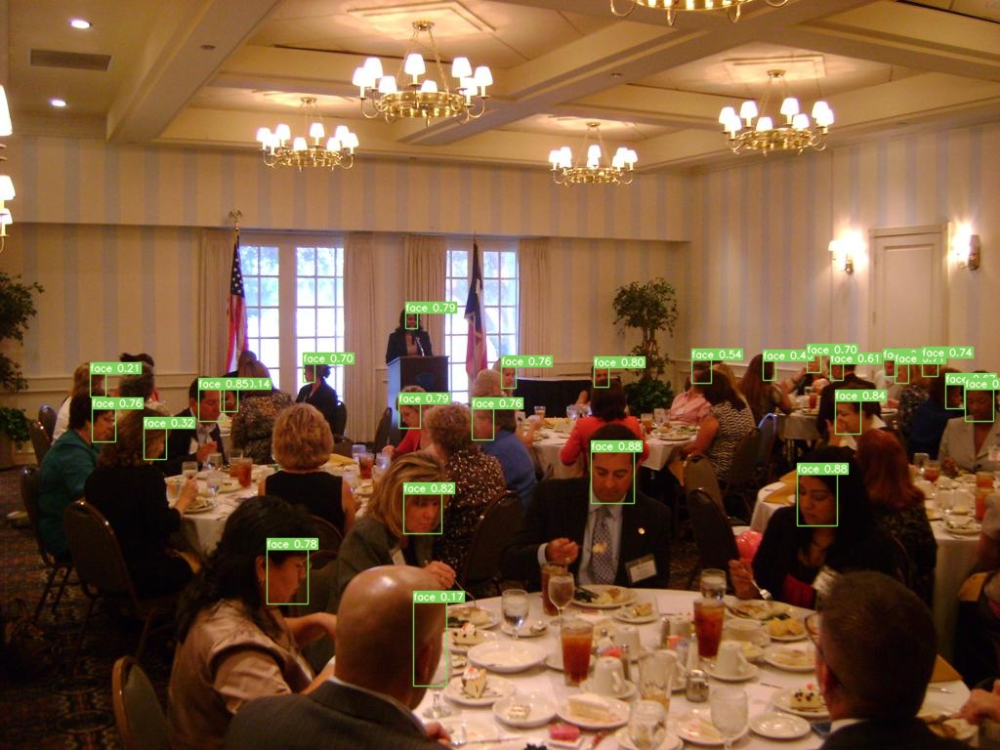

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp8/11_Meeting_Meeting_11_Meeting_Meeting_11_474.jpg", width=800))

### 5.2.3. Test image 3 (many faces, crowded room, close and away from the camera, different distances)

#### 5.2.3.1. yolov7/weights/best.pt

In [ ]:
!python detect.py --weights runs/train/yolov7/weights/best.pt --conf 0.1 --source "test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg', update=False, view_img=False, weights=['runs/train/yolov7/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # 

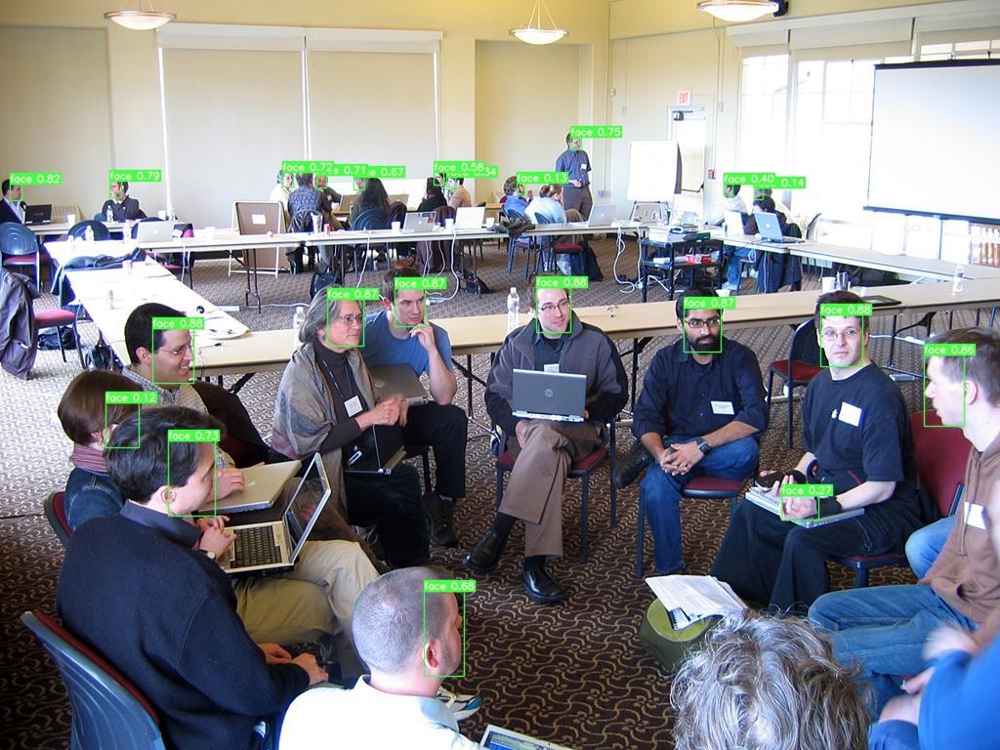

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp9/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg", width=800))

#### 5.2.3.2. yolov750/weights/best.pt

In [ ]:
!python detect.py --weights runs/train/yolov750/weights/best.pt --conf 0.1 --source "test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='test/images/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg', update=False, view_img=False, weights=['runs/train/yolov750/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: 

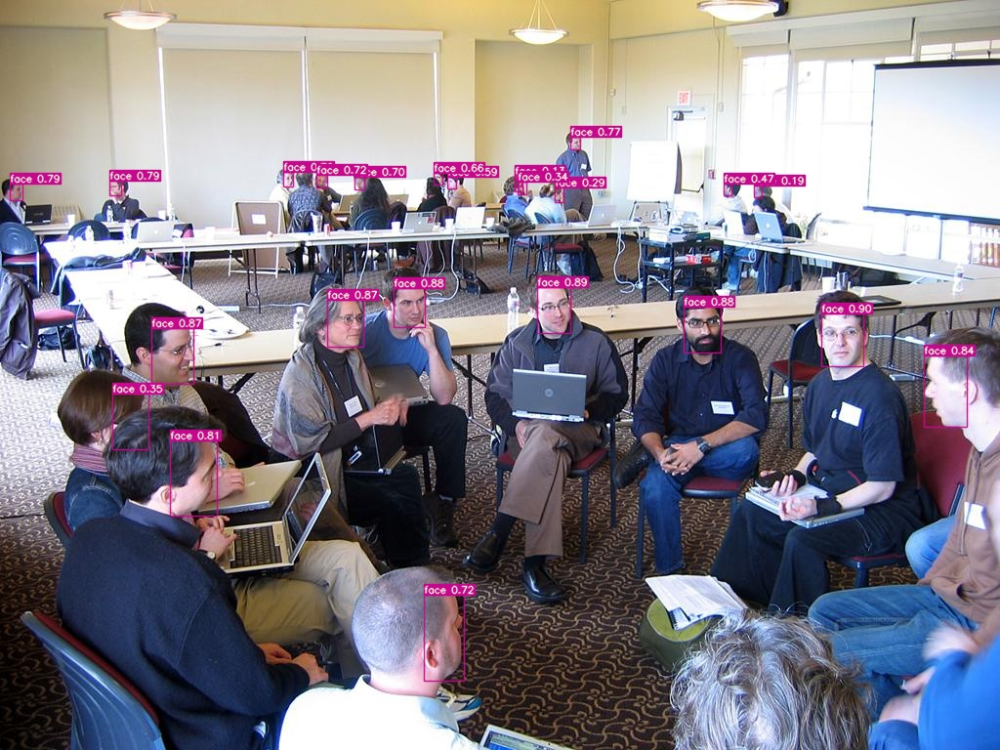

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp16/11_Meeting_Meeting_11_Meeting_Meeting_11_269.jpg", width=800))

### 5.2.4. Test image 4 (many faces, outdoor environment, close and away from the camera, different distances)

In [ ]:
!python detect.py --weights runs/train/yolov7/weights/best.pt --conf 0.1 --no-trace --source "test/images/61_Street_Battle_streetfight_61_82.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=True, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='test/images/61_Street_Battle_streetfight_61_82.jpg', update=False, view_img=False, weights=['runs/train/yolov7/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
13 faces, Done. (16.7ms) Inference, (1.8ms) NMS
 The image with the r

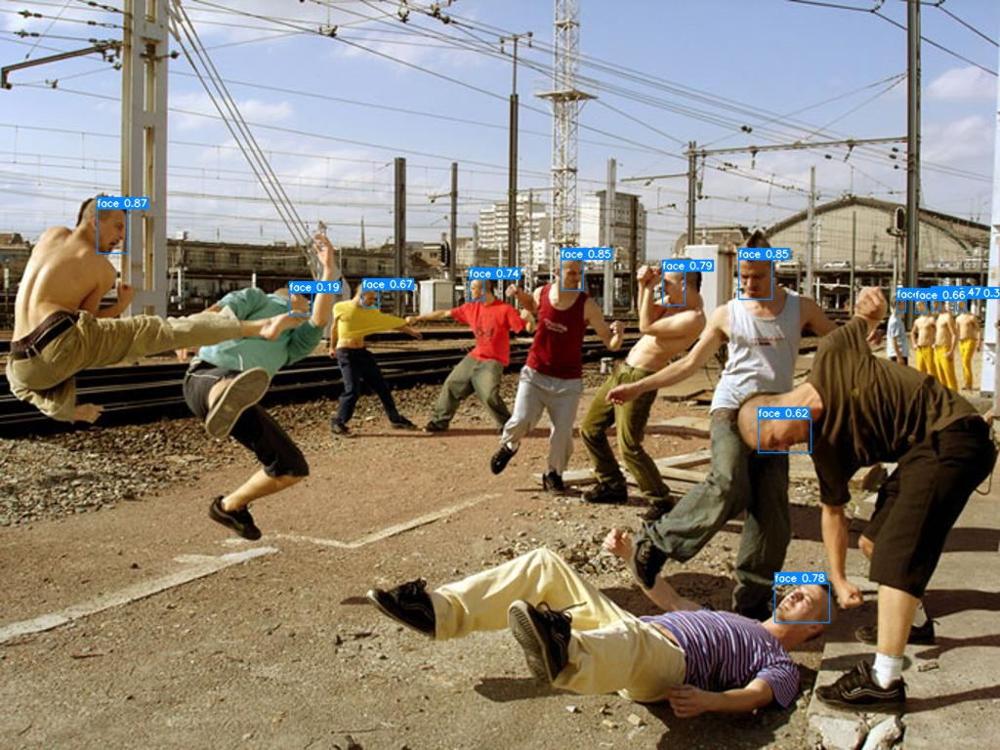

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp11/61_Street_Battle_streetfight_61_82.jpg", width=800))

### 5.2.5. Test image 5 (many faces, indoor environment, close to the camera, same distances)

In [ ]:
!python detect.py --weights runs/train/yolov7/weights/best.pt --conf 0.1 --no-trace --save-txt --source "test/images/58_Hockey_icehockey_puck_58_855.jpg"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=True, nosave=False, project='runs/detect', save_conf=False, save_txt=True, source='test/images/58_Hockey_icehockey_puck_58_855.jpg', update=False, view_img=False, weights=['runs/train/yolov7/weights/best.pt'])
YOLOR 🚀 2022-10-19 torch 1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536.1875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36481772 parameters, 6194944 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
27 faces, Done. (16.8ms) Inference, (1.9ms) NMS
 The image with the resul

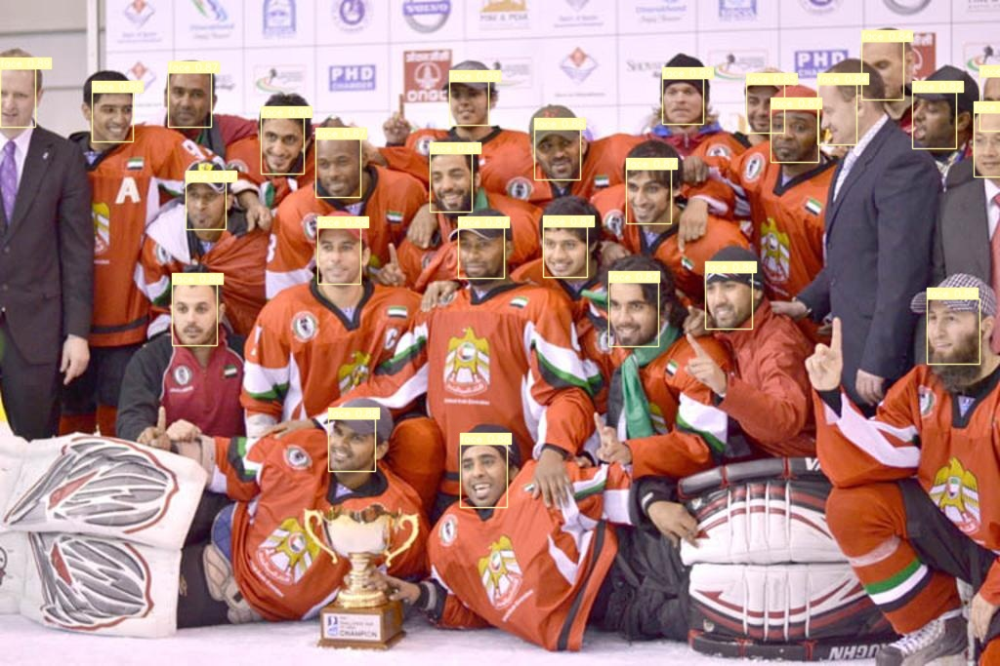

In [ ]:
display(IPython.display.Image(filename=f"{ref_path}/yolov7/runs/detect/exp12/58_Hockey_icehockey_puck_58_855.jpg", width=800))

## 5.3. Evaluate face detection on all test images

In [ ]:
!python detect.py --weights runs/train/yolov750/weights/best.pt --conf 0.1 --no-trace --save-txt --source "test/images/*.jpg"

In [ ]:
max_images_to_show = 10


for i, image_path in enumerate(glob.glob(f'{ref_path}/yolov7/runs/detect/exp/*.jpg')):
    if i < max_images_to_show:
      display(IPython.display.Image(filename=image_path))
      print("\n")
    

# 6. Inference on Custom Image/Video and Anonymization

## 6.1. Helper functions and classes

In [ ]:
import argparse
from base64 import b64decode, b64encode
import io
import html
import time
from typing import Tuple, Optional, List, Union
from typing_extensions import TypedDict
from pathlib import Path
import warnings

import cv2
from IPython.display import HTML, display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
import torch
import numpy as np
from numpy import random
import PIL
from PIL import Image
import torch.backends.cudnn as cudnn
import yaml

from models.experimental import attempt_load
from utils.datasets import LoadStreams, LoadImages
from utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression, apply_classifier, \
                          scale_coords, xyxy2xywh, xywh2xyxy, xywhn2xyxy, strip_optimizer, set_logging, increment_path
from utils.plots import plot_one_box
from utils.torch_utils import select_device, load_classifier, time_synchronized, TracedModel



def letterbox(img, new_shape=(640, 640), color=(114, 114, 114), auto=True, scaleFill=False, scaleup=True, stride=32):
    # Resize and pad image while meeting stride-multiple constraints
    shape = img.shape[:2]  # current shape [height, width]
    if isinstance(new_shape, int):
        new_shape = (new_shape, new_shape)

    # Scale ratio (new / old)
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
    if not scaleup:  # only scale down, do not scale up (for better test mAP)
        r = min(r, 1.0)

    # Compute padding
    ratio = r, r  # width, height ratios
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
    if auto:  # minimum rectangle
        dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
    elif scaleFill:  # stretch
        dw, dh = 0.0, 0.0
        new_unpad = (new_shape[1], new_shape[0])
        ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

    dw /= 2  # divide padding into 2 sides
    dh /= 2

    if shape[::-1] != new_unpad:  # resize
        img = cv2.resize(img, new_unpad, interpolation=cv2.INTER_LINEAR)
    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
    img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    return img, ratio, (dw, dh)



class FaceAnonymizer:
    __params_default = dict(
        blur_kernel_size=(11, 11),
        blur_sigma_x=10,
        blur_sigma_y=10,
        pixelate_type='static',
        pixelate_size=(8, 8),
        pixelate_ratio=10,
        block_intensity=0
    )

    class __params(TypedDict):
        method: str
        bbox_type: str
        blur_kernel_size: Optional[Tuple[int, int]]
        blur_sigma_x: Optional[float]
        blur_sigma_y: Optional[float]
        pixelate_type: Optional[str]
        pixelate_size: Optional[Tuple[int, int]]
        pixelate_ratio: Optional[float]
        block_intensity: Optional[int]

    def __init__(self, method: str = 'blur', bbox_type: str = 'xyxy', blur_kernel_size: Optional[Tuple[int, int]] = None,
                 blur_sigma_x: Optional[float] = None, blur_sigma_y: Optional[float] = None,
                 pixelate_type: Optional[str] = None, pixelate_size: Optional[Tuple[int, int]] = None,
                 pixelate_ratio: Optional[float] = None, block_intensity: Optional[int] = None):
        """Initializes an instance of the class to anonymize faces in the image according to given parameters.

        Args:
            method (str): Anonymization method; either 'blur', 'pixelate', or 'block'. Defaults to 'blur'.
            bbox_type (str): Type of bounding box values, either 'xyxy' or 'xywh'. Defaults to 'xyxy'.
            blur_kernel_size (Optional[Tuple[int, int]]): Gaussian blurring kernel size in the form of (height, width).
                                                          Defaults to None for (11, 11).
            blur_sigma_x (Optional[float]): Gaussian blurring kernel standard deviation along X-axis (horizontal).
                                            Defaults to None for 10.
            blur_sigma_y (Optional[float]): Gaussian blurring kernel standard deviation along Y-axis (vertical).
                                            Defaults to None for 10.
            pixelate_type (Optional[str]): How to resize image for pixelation; either 'static' to scale down to a fixed
                                           size given by pixelate_size, or 'dynamic' to scale down by a specified ratio
                                           given by pixelate_ratio. Defaults to None for 'static'.
            pixelate_size (Optional[Tuple[int, int]]): Target size in image scale down when pixelate_type is 'static'.
                                                       Defaults to None for (8, 8).
            pixelate_ratio (Optional[float]): Ratio to scale down the image when pixelate_type is 'dynamic'.
                                              Defaults to None for 10.
            block_intensity (Optional[int]): Intensity value (between 0 and 255) by which the face segment will be blocked.
                                             Defaults to None for 0 (black).

        Returns:
            self: The instance itself.
        """
        self.__params = dict(
            method=method,
            bbox_type=bbox_type,
            blur_kernel_size=blur_kernel_size if blur_kernel_size else self.__params_default['blur_kernel_size'],
            blur_sigma_x=blur_sigma_x if blur_sigma_x else self.__params_default['blur_sigma_x'],
            blur_sigma_y=blur_sigma_y if blur_sigma_y else self.__params_default['blur_sigma_y'],
            pixelate_type=pixelate_type if pixelate_type else self.__params_default['pixelate_type'],
            pixelate_size=pixelate_size if pixelate_size else self.__params_default['pixelate_size'],
            pixelate_ratio=pixelate_ratio if pixelate_ratio else self.__params_default['pixelate_ratio'],
            block_intensity=block_intensity if block_intensity else self.__params_default['block_intensity']
        )

    def anonymize(self, img: np.ndarray, faces: List[list], only_faces: bool = False) -> Optional[np.ndarray]:
        """Performs face anonymization on the input image.

        Args:
            img (np.ndarray): Input image.
            faces (list[list]): Bounding boxes of each face in the image.
            only_faces (bool): If True, only the pixels corresponding with anonymized face segments will be 
                            kept on the image while the remainin pixeles are 0. Defaults to False.

        Returns:
            Optional[np.ndarray]: Image after applying anonymization on faces or None in case of inplace operation.
        """
        h, w = img.shape[0], img.shape[1]

        face_segments = []
        for bounding_box in faces:
            x1, y1, x2, y2 = self._convert_bbox_to_xyxy(bbox=bounding_box, img_w=w, img_h=h)
            face_segments.append({'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'face': img[y1:y2, x1:x2, :]})

        new_img = np.zeros(img.shape) if only_faces else img.copy()
        for face_segment in face_segments:
            if self.method == 'blur':
                face = cv2.GaussianBlur(
                    src=face_segment['face'],
                    ksize=self.blur_kernel_size,
                    sigmaX=self.blur_sigma_x,
                    sigmaY=self.blur_sigma_y
                )

            elif self.method == 'pixelate':
                if self.pixelate_type == 'static':
                    target_size = self.pixelate_size
                else:
                    target_size = tuple((np.array(face_segment['face'].shape[:2]) / self.pixelate_ratio).astype(int))
                target_size = tuple([v if v >= 2 else 2 for v in target_size])

                face_small = Image.fromarray(face_segment['face']).resize(target_size, resample=Image.BILINEAR)
                face = np.array(face_small.resize(Image.fromarray(face_segment['face']).size, Image.NEAREST))

            elif self.method == 'block':
                face = face_segment['face']
                face[:, :] = self.block_intensity

            else:
                raise ValueError(f"'{self.method}' is not a valid method; must be either 'blur', 'pixelate', or 'block'")

            x1, y1, x2, y2 = face_segment['x1'], face_segment['y1'], face_segment['x2'], face_segment['y2']
            new_img[y1:y2, x1:x2, :] = face
        
        return new_img

    def _convert_bbox_to_xyxy(self, bbox: list, img_w: int, img_h: int) -> Tuple[int, int, int, int]:
        bbox = bbox if isinstance(bbox[0], (int, float)) else torch.tensor(bbox).int()

        if self.bbox_type == 'xywh':
            bbox = bbox if type(bbox[0]) is int else np.array(bbox) * np.array([img_w, img_h, img_w, img_h])
            x1, y1, x2, y2 = bbox.astype(np.int)
        else:
            x1, y1, x2, y2 = bbox

        return x1, y1, x2, y2

    @property
    def method(self) -> str:
        """Anonymization method; either 'blur', 'pixelate', or 'block'.

        """
        return self.__params.get('method')

    @method.setter
    def method(self, value: str):
        if value not in ['blur', 'pixelate', 'block']:
            raise ValueError(f"'{value}' is not a valid method; must be either 'blur', 'pixelate', or 'block'")
        self.__params['method'] = value if value else self.__params_default['method']

    @property
    def bbox_type(self) -> str:
        """Type of bounding box values, either 'xyxy' or 'xywh'.

        """
        return self.__params.get('bbox_type')

    @bbox_type.setter
    def bbox_type(self, value: str):
        if value not in ['xyxy', 'xywh']:
            raise ValueError(f"'{value}' is not a valid bbox_type; must be either 'xyxy' or 'xywh'")
        self.__params['bbox_type'] = value if value else self.__params_default['bbox_type']

    @property
    def blur_kernel_size(self) -> Optional[Tuple[int, int]]:
        """Gaussian blurring kernel size in the form of (height, width).

        """
        return self.__params.get('blur_kernel_size')

    @blur_kernel_size.setter
    def blur_kernel_size(self, value: Optional[Tuple[int, int]]):
        self.__params['blur_kernel_size'] = value if value else self.__params_default['blur_kernel_size']

    @property
    def blur_sigma_x(self) -> Optional[float]:
        """Gaussian blurring kernel standard deviation along X-axis (horizontal direction).

        """
        return self.__params.get('blur_sigma_x')

    @blur_sigma_x.setter
    def blur_sigma_x(self, value: Optional[float]):
        self.__params['blur_sigma_x'] = value if value else self.__params_default['blur_sigma_x']

    @property
    def blur_sigma_y(self) -> Optional[float]:
        """Gaussian blurring kernel standard deviation along Y-axis (vertical direction).

        """
        return self.__params.get('blur_sigma_y')

    @blur_sigma_y.setter
    def blur_sigma_y(self, value: Optional[float]):
        self.__params['blur_sigma_y'] = value if value else self.__params_default['blur_sigma_y']

    @property
    def pixelate_type(self) -> Optional[str]:
        """How to resize image for pixelation; either 'static' to scale down to a fixed size given by pixelate_size,
         or 'dynamic' to scale down by a specified ratio given by pixelate_ratio.

        """
        return self.__params.get('pixelate_type')

    @pixelate_type.setter
    def pixelate_type(self, value: Optional[str]):
        if value not in ['static', 'dynamic']:
            raise ValueError(f"'{value}' is not a valid pixelate_type; must be either 'static' or 'dynamic'")
        self.__params['pixelate_type'] = value if value else self.__params_default['pixelate_type']

    @property
    def pixelate_size(self) -> Optional[Tuple[int, int]]:
        """Target size in image scale down when pixelate_type is 'static'.

        """
        return self.__params.get('pixelate_size')

    @pixelate_size.setter
    def pixelate_size(self, value: Optional[Tuple[int, int]]):
        self.__params['pixelate_size'] = value if value else self.__params_default['pixelate_size']

    @property
    def pixelate_ratio(self) -> Optional[float]:
        """Ratio to scale down the image when pixelate_type is 'dynamic'.

        """
        return self.__params.get('pixelate_ratio')

    @pixelate_ratio.setter
    def pixelate_ratio(self, value: Optional[float]):
        self.__params['pixelate_ratio'] = value if value else self.__params_default['pixelate_ratio']

    @property
    def block_intensity(self) -> Optional[int]:
        """Intensity value (between 0 and 255) by which the face segment will be blocked.

        """
        return self.__params.get('block_intensity')

    @block_intensity.setter
    def block_intensity(self, value: Optional[int]):
        self.__params['block_intensity'] = value if value else self.__params_default['block_intensity']

    def __repr__(self) -> str:
        return f"<FaceAnonymizer(method='{self.method}', bbox_type='{self.bbox_type}')>"



class YOLOv7Configs:
    class __params(TypedDict):
        weights: str
        cfg: str
        img_size: int
        conf_thres: float
        iou_thres: float
        device: str
        classes: Optional[list]

    def __init__(self, weights: str, cfg: str, img_size: int = 640, conf_thres: float = 0.25, iou_thres: float = 0.45,
                 device: str = '0', classes: Optional[list] = None):
        """Initializes an instance of the class to hold YOLOv7 model configurations.

        Args:
            weights (str): Path to the weights of the pre-trained model, i.e., 'model.pt' file.
            cfg (str): Path to the YOLOv7 YAML config file used in training.
            img_size (int): Inference image size (in pixels). Defaults to 640.
            conf_thres (float): Object confidence threshold for inference. Defaults to 0.25.
            iou_thres (float): IOU threshold for non-maximum suppression (NMS) for inference. Defaults to 0.45.
            device (str): Device to run the model, e.g., '0', '1', '2', '3', or 'cpu'. Defaults '0'.
            classes (Optional[list]): List of classes to filter. Defaults to None.

        Returns:
            self: The instance itself.
        """
        with open(cfg, "r") as f:
            cfg_dict = yaml.safe_load(f)
        
        self.__params = dict(
            weights=weights,
            cfg=cfg_dict,
            img_size=img_size,
            conf_thres=conf_thres,
            iou_thres=iou_thres,
            device=device,
            classes=classes
        )

    @property
    def weights(self) -> str:
        """Path to the weights of the pre-trained model (i.e., 'model.pt' file).

        """
        return self.__params.get('weights')

    @weights.setter
    def weights(self, value: str):
        self.__params['weights'] = value

    @property
    def cfg(self) -> dict:
        """YOLOv7 configs used in training.

        """
        return self.__params.get('cfg')

    @cfg.setter
    def cfg(self, value: Union[dict, str]):
        cfg_dict = value
        if isinstance(value, str):
            with open(value, "r") as f:
                cfg_dict = yaml.safe_load(f)
        
        self.__params['cfg'] = cfg_dict

    @property
    def img_size(self) -> int:
        """Inference image size (in pixels).

        """
        return self.__params.get('img_size')

    @img_size.setter
    def img_size(self, value: int):
        self.__params['img_size'] = value

    @property
    def conf_thres(self) -> float:
        """Object confidence threshold for inference.

        """
        return self.__params.get('conf_thres')

    @conf_thres.setter
    def conf_thres(self, value: float):
        self.__params['conf_thres'] = value

    @property
    def iou_thres(self) -> float:
        """IOU threshold for non-maximum suppression (NMS) for inference.

        """
        return self.__params.get('iou_thres')

    @iou_thres.setter
    def iou_thres(self, value: float):
        self.__params['iou_thres'] = value

    @property
    def device(self) -> str:
        """Device to run the model, e.g., '0', '1', '2', '3', or 'cpu'.

        """
        return self.__params.get('device')

    @device.setter
    def device(self, value: str):
        self.__params['device'] = value

    @property
    def classes(self) -> Optional[list]:
        """List of classes to filter.

        """
        return self.__params.get('classes')

    @classes.setter
    def classes(self, value: Optional[list]):
        self.__params['classes'] = value

    def __repr__(self) -> str:
        return (
            f"<YOLOv7Configs(weights='{self.weights}', cfg='{self.cfg}', img_size={self.img_size}, "
            f"conf_thres={self.conf_thres}, iou_thres={self.iou_thres}, device='{self.device}')>"
        )



class YOLOv7Face:
    def __init__(self, configs: YOLOv7Configs, anonymizer: Optional[FaceAnonymizer] = None,
                 display_num_faces: bool = True, verbose: bool = False):
        """Initializes an instance of the class to use YOLOv7 model for face detection and/or anonymization.

        Args:
            configs (YOLOv7Configs): YOLOv7 model configurations.
            anonymizer (Optional[FaceAnonymizer]): An optional FaceAnonymizer if willing to apply face anonymizer.
                                                   Defaults to None.
            display_num_faces (bool): Whether to display the number of detected faces in the image. Defaults to True.
            verbose (bool): Verbosity level. Defaults to False.

        Returns:
            self: The instance itself.
        """
        self.configs: YOLOv7Configs = configs
        self.anonymizer: Optional[FaceAnonymizer] = anonymizer
        self.display_num_faces: bool = display_num_faces
        self.verbose = verbose

        if self.anonymizer and self.anonymizer.bbox_type != 'xyxy':
            self.anonymizer.bbox_type = 'xyxy'
            warnings.warn("anonymizer.bbox_type must be 'xyxy'. It was automatically changed to 'xyxy'")

    def predict_img(self, img: Union[str, Image.Image, np.ndarray], bboxes: Optional[List[list]] = None,
                    view_img: bool = True, save_to: Optional[str] = None):
        """Performs face detection (and anonymization if self.anonymizer is provided) on the input image.

        Args:
            img (Union[str, Image.Image, np.ndarray]): Input image for face detection and/or anonymization.
            bboxes (Optional[List[list]]): Optional bounding boxes to display on the image. Defaults to None.
            view_img (bool): Whether to display the output image. Defaults to True.
            save_to (Optional[str]): If provided, the output image will be saved to this path. Defaults to None.

        Returns:
            np.ndarray: Output image after face detection and/or anonymization.
        """
        if isinstance(img, str):
            img0 = cv2.imread(img)
        elif isinstance(img, Image.Image):
            img0 = np.array(img)
        else:
            img0 = img.copy()

        with torch.no_grad():
            set_logging(-1 if self.verbose else 1)
            device = select_device(self.configs.device)
            half = device.type != 'cpu'
            model = attempt_load(self.configs.weights, map_location=device)  # Load FP32 model
            if half:
                model.half()

            names = model.module.names if hasattr(model, 'module') else model.names
            colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]

            stride = int(model.stride.max())  # Model stride
            imgsz = check_img_size(self.configs.img_size, s=stride)  # Check img_size

            if device.type != 'cpu':
                model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))

            img = letterbox(img0, imgsz, stride=stride)[0]
            img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
            img = np.ascontiguousarray(img)
            img = torch.from_numpy(img).to(device)
            img = img.half() if half else img.float()  # uint8 to fp16/32
            img /= 255.0  # Convert [0, 255] to [0.0, 1.0]
            if img.ndimension() == 3:
                img = img.unsqueeze(0)

            # Inference
            t1 = time_synchronized()
            pred = model(img, augment=False)[0]

            # Apply NMS
            classes = None
            if self.configs.classes:
                classes = []
                for class_name in self.configs.classes:
                    classes.append(names.index(class_name))

            if classes:
                classes = [i for i in range(len(names)) if i not in classes]

            pred = non_max_suppression(pred, self.configs.conf_thres, self.configs.iou_thres, classes=classes,
                                       agnostic=False)

            t2 = time_synchronized()

            n_faces = 0
            for i, det in enumerate(pred):
                s = ''
                s += '%gx%g ' % img.shape[2:]  # Print string
                gn = torch.tensor(img0.shape)[[1, 0, 1, 0]]
                if len(det):
                    det[:, :4] = scale_coords(img.shape[2:], det[:, :4], img0.shape).round()

                    for c in det[:, -1].unique():
                        n = (det[:, -1] == c).sum()  # Detections per class
                        s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # Add to string

                    for *xyxy, conf, cls in reversed(det):
                        if self.anonymizer:
                            img0 = self.anonymizer.anonymize(img=img0, faces=[xyxy])
                        else:
                            label = f'{names[int(cls)]} {conf:.2f}'
                            plot_one_box(xyxy, img0, label=label, color=colors[int(cls)], line_thickness=3)

                    n_faces = (det[:, -1] == c).sum()
            
            if self.display_num_faces:
                img0 = cv2.putText(img0, text=f"{n_faces or 'no'} face{'s' * (n_faces==0 or n_faces>1)}",
                                   org=(20, 50), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.3, color=(255,0,0),
                                   thickness=2, lineType=cv2.LINE_AA)
                
            if bboxes:
                for bbox in bboxes:
                    plot_one_box(bbox, img0, label="ground truth", line_thickness=2)


        if save_to:
            Image.fromarray(img0).save(save_to)

        if view_img:
            cv2_imshow(img0)

        return img0

    def predict_video(self, video_path: str, save_to: str):
        """Performs face detection (and anonymization if self.anonymizer is provided) on the input video.

        Args:
            video_path (str): Path to the input video for face detection and/or anonymization.
            save_to (str): Path to save the output video.
        """
        video = cv2.VideoCapture(video_path)

        # Video information
        fps = video.get(cv2.CAP_PROP_FPS)
        w = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
        h = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
        nframes = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

        # Initializing object for writing video output
        output = cv2.VideoWriter(save_to, cv2.VideoWriter_fourcc(*'DIVX'), fps, (w, h))
        torch.cuda.empty_cache()

        # Initializing model and setting it for inference
        with torch.no_grad():
            set_logging(-1 if self.verbose else 1)
            device = select_device(self.configs.device)
            half = device.type != 'cpu'
            model = attempt_load(self.configs.weights, map_location=device)  # load FP32 model
            stride = int(model.stride.max())  # model stride
            imgsz = check_img_size(self.configs.img_size, s=stride)  # check img_size
            if half:
                model.half()

            names = model.module.names if hasattr(model, 'module') else model.names
            colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]
            if device.type != 'cpu':
                model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))

            classes = None
            if self.configs.classes:
                classes = []
                for class_name in self.configs.classes:
                    classes.append(names.index(class_name))

            if classes:
                classes = [i for i in range(len(names)) if i not in classes]

            for j in range(nframes):
                ret, img0 = video.read()

                if ret:
                    img = letterbox(img0, imgsz, stride=stride)[0]
                    img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
                    img = np.ascontiguousarray(img)
                    img = torch.from_numpy(img).to(device)
                    img = img.half() if half else img.float()  # uint8 to fp16/32
                    img /= 255.0  # Convert [0, 255] to [0.0, 1.0]
                    if img.ndimension() == 3:
                        img = img.unsqueeze(0)

                    # Inference
                    t1 = time_synchronized()
                    pred = model(img, augment=False)[0]

                    pred = non_max_suppression(pred, self.configs.conf_thres, self.configs.iou_thres, classes=classes,
                                               agnostic=False)
                    t2 = time_synchronized()

                    n_faces = 0
                    for i, det in enumerate(pred):
                        s = ''
                        s += '%gx%g ' % img.shape[2:]  # print string
                        gn = torch.tensor(img0.shape)[[1, 0, 1, 0]]
                        if len(det):
                            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], img0.shape).round()

                            for c in det[:, -1].unique():
                                n = (det[:, -1] == c).sum()  # detections per class
                                s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                            for *xyxy, conf, cls in reversed(det):
                                if self.anonymizer:
                                    img0 = self.anonymizer.anonymize(img=img0, faces=[xyxy])
                                else:
                                    label = f'{names[int(cls)]} {conf:.2f}'
                                    plot_one_box(xyxy, img0, label=label, color=colors[int(cls)], line_thickness=3)

                            n_faces = (det[:, -1] == c).sum()
            
                    if self.display_num_faces:
                        img0 = cv2.putText(img0, text=f"{n_faces or 'no'} face{'s' * (n_faces==0 or n_faces>1)}",
                                        org=(20, 50), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.3, color=(255,0,0),
                                        thickness=2, lineType=cv2.LINE_AA)

                    if self.verbose:
                        print(f"{j + 1}/{nframes} frames processed")

                    output.write(img0)
                else:
                    break

        output.release()
        video.release()

    @staticmethod
    def js_to_image(js_object) -> np.ndarray:
        """Converts a given JavaScript object into an OpenCV image.

        Args:
            js_object: JavaScript object.
        
        Returns:
            np.ndarray: OpenCV BGR image.
        """
        # Decode base64 image
        image_bytes = b64decode(js_object.split(',')[1])

        # Convert bytes to numpy array
        jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)

        # Cecode numpy array into OpenCV BGR image
        img = cv2.imdecode(jpg_as_np, flags=1)

        return img

    @staticmethod
    def bbox_to_bytes(bbox_array) -> bytes:
        """Converts OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream.

        Args:
            bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
        
        Returns:
            bytes: Base64 image byte string.
        """
        # Convert array into PIL image
        bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')  # RGBA
        iobuf = io.BytesIO()

        # Format bbox into png for return
        bbox_PIL.save(iobuf, format='png')

        # Format return string
        bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

        return bbox_bytes

    @staticmethod
    def video_stream() -> None:
        """JavaScript to properly create live video stream using webcam as input.

        """
        js = Javascript('''
            var video;
            var div = null;
            var stream;
            var captureCanvas;
            var imgElement;
            var labelElement;
            
            var pendingResolve = null;
            var shutdown = false;
            
            function removeDom() {
                stream.getVideoTracks()[0].stop();
                video.remove();
                div.remove();
                video = null;
                div = null;
                stream = null;
                imgElement = null;
                captureCanvas = null;
                labelElement = null;
            }
            
            function onAnimationFrame() {
                if (!shutdown) {
                    window.requestAnimationFrame(onAnimationFrame);
                }
                if (pendingResolve) {
                    var result = "";
                    if (!shutdown) {
                        captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
                        result = captureCanvas.toDataURL('image/jpeg', 0.8)
                    }
                    var lp = pendingResolve;
                    pendingResolve = null;
                    lp(result);
                }
            }
            
            async function createDom() {
                if (div !== null) {
                    return stream;
                }

                div = document.createElement('div');
                div.style.border = '2px solid black';
                div.style.padding = '3px';
                div.style.width = '100%';
                div.style.maxWidth = '600px';
                document.body.appendChild(div);
                
                const modelOut = document.createElement('div');
                modelOut.innerHTML = "Status: ";
                labelElement = document.createElement('span');
                labelElement.innerText = 'No data';
                labelElement.style.fontWeight = 'bold';
                modelOut.appendChild(labelElement);
                div.appendChild(modelOut);
                    
                video = document.createElement('video');
                video.style.display = 'block';
                video.width = div.clientWidth - 6;
                video.setAttribute('playsinline', '');
                video.onclick = () => { shutdown = true; };
                stream = await navigator.mediaDevices.getUserMedia(
                    {video: { facingMode: "user"}});
                div.appendChild(video);

                imgElement = document.createElement('img');
                imgElement.style.position = 'absolute';
                imgElement.style.zIndex = 1;
                imgElement.onclick = () => { shutdown = true; };
                div.appendChild(imgElement);
                
                const instruction = document.createElement('div');
                instruction.innerHTML = 
                    '' +
                    'When finished, click here or on the video to close the display';
                div.appendChild(instruction);
                instruction.onclick = () => { shutdown = true; };
                
                video.srcObject = stream;
                await video.play();

                captureCanvas = document.createElement('canvas');
                captureCanvas.width = 640; //video.videoWidth;
                captureCanvas.height = 480; //video.videoHeight;
                window.requestAnimationFrame(onAnimationFrame);
                
                return stream;
            }

            async function stream_frame(label, imgData) {
                if (shutdown) {
                    removeDom();
                    shutdown = false;
                    return '';
                }

                var preCreate = Date.now();
                stream = await createDom();
                
                var preShow = Date.now();
                if (label != "") {
                    labelElement.innerHTML = label;
                }
                        
                if (imgData != "") {
                    var videoRect = video.getClientRects()[0];
                    imgElement.style.top = videoRect.top + "px";
                    imgElement.style.left = videoRect.left + "px";
                    imgElement.style.width = videoRect.width + "px";
                    imgElement.style.height = videoRect.height + "px";
                    imgElement.src = imgData;
                }
                
                var preCapture = Date.now();
                var result = await new Promise(function(resolve, reject) {
                    pendingResolve = resolve;
                });
                shutdown = false;
                
                return {'create': preShow - preCreate, 
                        'show': preCapture - preShow, 
                        'capture': Date.now() - preCapture,
                        'img': result};
            }
            '''
        )

        display(js)
    
    @staticmethod
    def video_frame(label: str, bbox):
        data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
        return data

    def predict_webcam(self):
        # Start streaming video from webcam
        self.video_stream()
        label_html = 'Capturing...'

        bbox = ''
        with torch.no_grad():
            set_logging(-1 if self.verbose else 1)
            device = select_device(self.configs.device)
            half = device.type != 'cpu'

            model = attempt_load(self.configs.weights, map_location=device)
            stride = int(model.stride.max())

            imgsz = (480, 640)

            if half:
                model.half()

            names = model.module.names if hasattr(model, 'module') else model.names
            colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]
            if device.type != 'cpu':
                model(torch.zeros(1, 3, imgsz[0], imgsz[1]).to(device).type_as(next(model.parameters())))
            
            classes = None
            if self.configs.classes:
                classes = []
                for class_name in self.configs.classes:
                    classes.append(names.index(class_name))

            if classes:
                classes = [i for i in range(len(names)) if i not in classes]
            
            while True:
                js_reply = self.video_frame(label_html, bbox)
                if not js_reply:
                    break
                
                img0 = self.js_to_image(js_reply["img"])
                bbox_array = np.zeros([480, 640, 4], dtype=np.uint8)
                img = letterbox(img0, imgsz, stride=stride)[0]
                img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB
                img = np.ascontiguousarray(img)
                img = torch.from_numpy(img).to(device)
                img = img.half() if half else img.float()
                img /= 255.0  # Conver [0, 255] to [0.0, 1.0]
                if img.ndimension() == 3:
                    img = img.unsqueeze(0)

                # Inference
                t1 = time_synchronized()
                pred = model(img, augment=False)[0]

                # Apply NMS
                pred = non_max_suppression(pred, self.configs.conf_thres, self.configs.iou_thres, classes=classes, agnostic=False)
                t2 = time_synchronized()

                n_faces = 0
                for i, det in enumerate(pred):
                    s = ''
                    s += '%gx%g ' % img.shape[2:]  # print string
                    gn = torch.tensor(img0.shape)[[1, 0, 1, 0]]
                    if len(det):
                        det[:, :4] = scale_coords(img.shape[2:], det[:, :4], img0.shape).round()

                        for c in det[:, -1].unique():
                            n = (det[:, -1] == c).sum()  # detections per class
                            s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                        for *xyxy, conf, cls in reversed(det):
                            if self.anonymizer:
                                bbox_array[:, :, :3] = self.anonymizer.anonymize(img=img0, faces=[xyxy], only_faces=True)
                            else:
                                label = f'{names[int(cls)]} {conf:.2f}'
                                plot_one_box(xyxy, bbox_array, label=label, color=colors[int(cls)], line_thickness=3)

                        n_faces = (det[:, -1] == c).sum()

                if self.display_num_faces:
                    bbox_array = cv2.putText(bbox_array, text=f"{n_faces or 'no'} face{'s' * (n_faces==0 or n_faces>1)}",
                                            org=(20, 50), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.3, color=(255,0,0),
                                            thickness=2, lineType=cv2.LINE_AA)
                
                bbox_array[:, :, 3] = (bbox_array.max(axis = 2) > 0).astype(int) * 255
                bbox_bytes = self.bbox_to_bytes(bbox_array)
                
                bbox = bbox_bytes


def display_video(filepath: str, display_width: int = 480, compress: bool = False):
    """Displays a MP4 video on Google Colab environment.

    Args:
        filepath (str): Video filepath.
        display_width (int): Width of the video control box. Defaults to 480.
        compress (bool): Whether to compress the video and display the compressed version. Default to False.

    Returns:
        HTML: Video display box.
    """
    if compress:
        filepath_parts = filepath.split(".")
        filepath_parts[-2] += "-compressed"
        compressed_path = ".".join(filepath_parts)

        os.system(f"ffmpeg -i {filepath} -vcodec libx264 {compressed_path}")
        filepath = compressed_path

    mp4 = open(filepath, 'rb').read()
    video_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(
        f"""
            <video width={display_width} controls>
                <source src="{video_url}" type="video/mp4">
            </video>
        """
    )

## 6.2. Configurations

In [ ]:
classes_to_filter = []  


# opt  = {
#     "weights": "runs/train/yolov750/weights/best.pt"
#     "yaml"   : "data/widerface.yaml",
#     "img-size": 640, # default image size
#     "conf-thres": 0.2, # confidence threshold for inference.
#     "iou-thres" : 0.45, # NMS IoU threshold for inference.
#     "device" : '0',  # device to run our model i.e. 0 or 0,1,2,3 or cpu
#     "classes" : classes_to_filter  # list of classes to filter or None
# }


model_configs = YOLOv7Configs(
    weights="runs/train/yolov750/weights/best.pt",
    cfg="data/celeba.yaml",
    img_size=640,
    conf_thres=0.2,
    iou_thres=0.45,
    device='0'
)

## 6.3. Inference on a single image

### 6.3.1. Sample

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


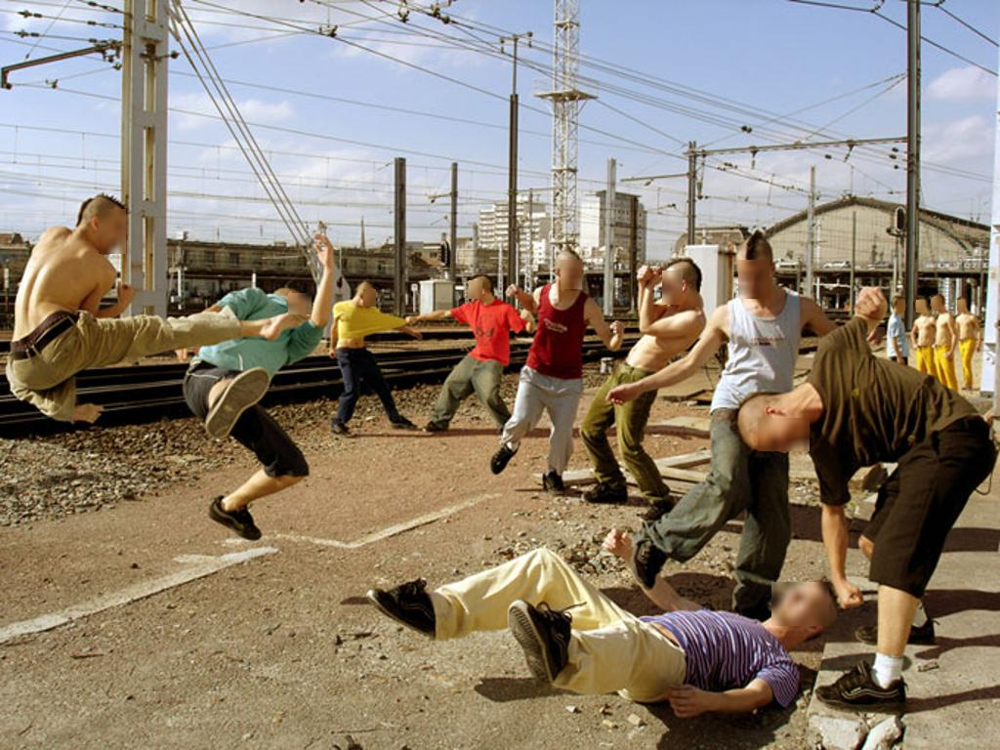

In [ ]:
from google.colab.patches import cv2_imshow

# Source image file path
source_image_path = f"{ref_path}/yolov7/test/images/61_Street_Battle_streetfight_61_82.jpg"

# Detection action
det_action = "anon"          # "bbox" or "anon"
anon_method = "blur"     # "blur", "pixelate", or "block"



with torch.no_grad():
    weights, imgsz = opt['weights'], opt['img-size']
    set_logging()
    device = select_device(opt['device'])
    half = device.type != 'cpu'
    model = attempt_load(weights, map_location=device)  # load FP32 model
    stride = int(model.stride.max())  # model stride
    imgsz = check_img_size(imgsz, s=stride)  # check img_size
    if half:
        model.half()

    names = model.module.names if hasattr(model, 'module') else model.names
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]
    if device.type != 'cpu':
        model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))

    img0 = cv2.imread(source_image_path)
    img = letterbox(img0, imgsz, stride=stride)[0] 
    img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
    img = np.ascontiguousarray(img)
    img = torch.from_numpy(img).to(device)
    img = img.half() if half else img.float()  # uint8 to fp16/32
    img /= 255.0  # 0 - 255 to 0.0 - 1.0
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    t1 = time_synchronized()
    pred = model(img, augment= False)[0]
    
    # Apply NMS
    classes = None
    if opt['classes']:
        classes = []
        for class_name in opt['classes']:
            classes.append(names.index(class_name))

    if classes:
        classes = [i for i in range(len(names)) if i not in classes]
  
  
    pred = non_max_suppression(pred, opt['conf-thres'], opt['iou-thres'], classes=classes, agnostic= False)
    
    t2 = time_synchronized()
    for i, det in enumerate(pred):
        s = ''
        s += '%gx%g ' % img.shape[2:]  # print string
        gn = torch.tensor(img0.shape)[[1, 0, 1, 0]]
        if len(det):
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], img0.shape).round()

            for c in det[:, -1].unique():
                n = (det[:, -1] == c).sum()  # detections per class
                s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string
    
            for *xyxy, conf, cls in reversed(det):
                if det_action == 'bbox':
                    label = f'{names[int(cls)]} {conf:.2f}'
                    plot_one_box(xyxy, img0, label=label, color=colors[int(cls)], line_thickness=3)
                else:
                    img0 = anonymize(img0, faces=[xyxy], bbox_type='xyxy', method=anon_method)


cv2_imshow(img0)

### 6.3.2. Pixelate

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


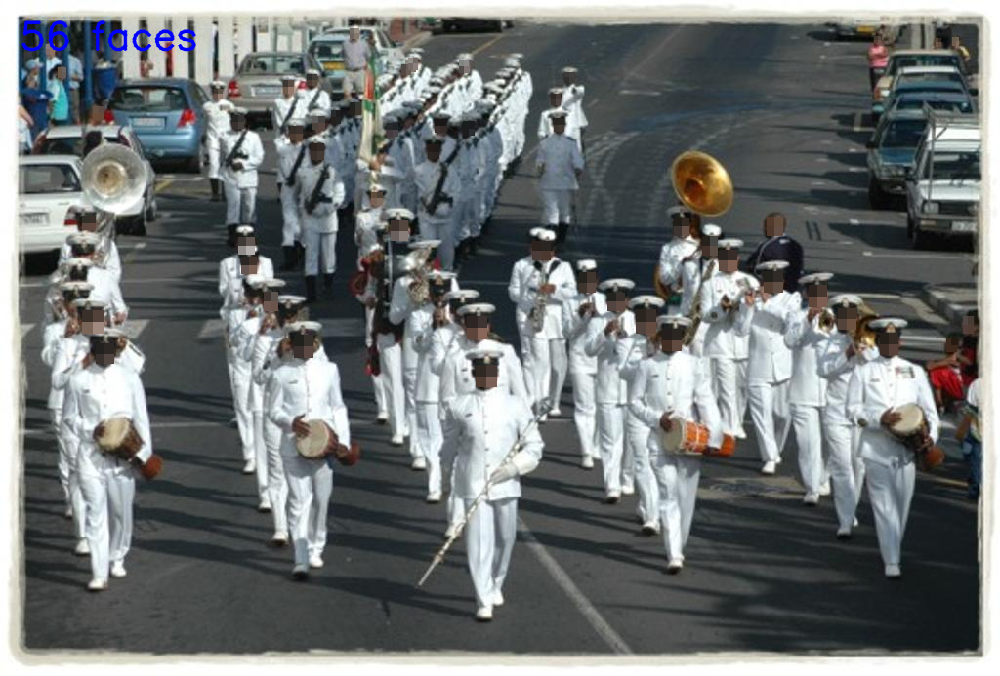

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='pixelate',
    bbox_type='xyxy',
    pixelate_type='dynamic',
    pixelate_ratio=10
)
yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)

output_img = yolo_model.predict_img(f"{ref_path}/yolov7/test/images/0_Parade_marchingband_1_168.jpg")



Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


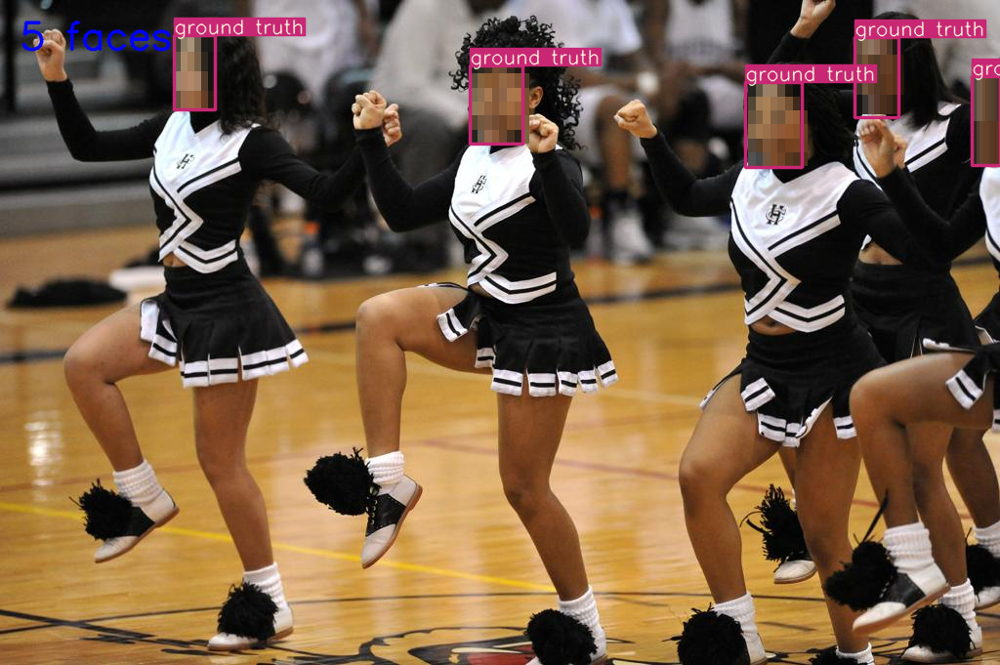

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='pixelate',
    bbox_type='xyxy',
    pixelate_type='dynamic',
    pixelate_ratio=10
)
yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


image_filepath = f"{ref_path}/yolov7/train/images/35_Basketball_Basketball_35_148.jpg"


ground_truth = []
img_width, img_height = imagesize.get(image_filepath)
with open(image_filepath.replace("/images/", "/labels/").replace(".jpg", ".txt"), 'r') as f:
    for line in f:
        ground_truth.append(
            xywhn2xyxy(
                np.array(line.replace('\n', '').split(' ')[1:]).reshape(1,-1).astype(float),
                w=img_width, h=img_height
            ).astype(int).tolist()[0]
        )

output_img = yolo_model.predict_img(image_filepath, bboxes=ground_truth)

### 6.3.3. Blur

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


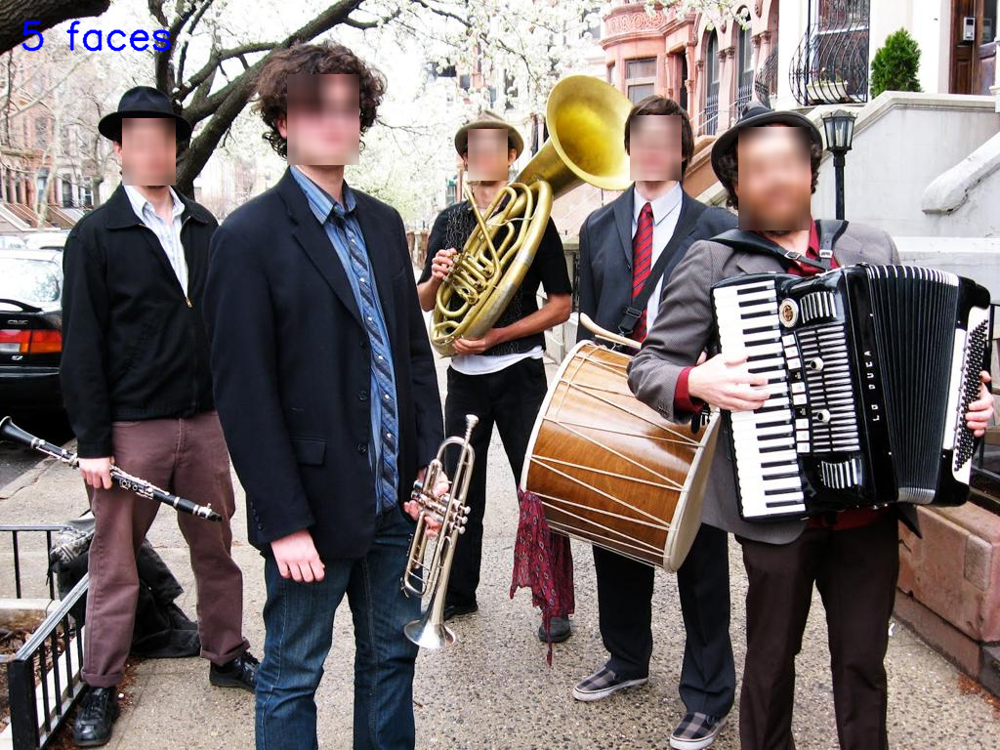

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='blur',
    bbox_type='xyxy',
    blur_kernel_size=(21, 21),
    blur_sigma_x=255,
    blur_sigma_y=255
)
yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)

output_img = yolo_model.predict_img(f"{ref_path}/yolov7/test/images/0_Parade_marchingband_1_1032.jpg")

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


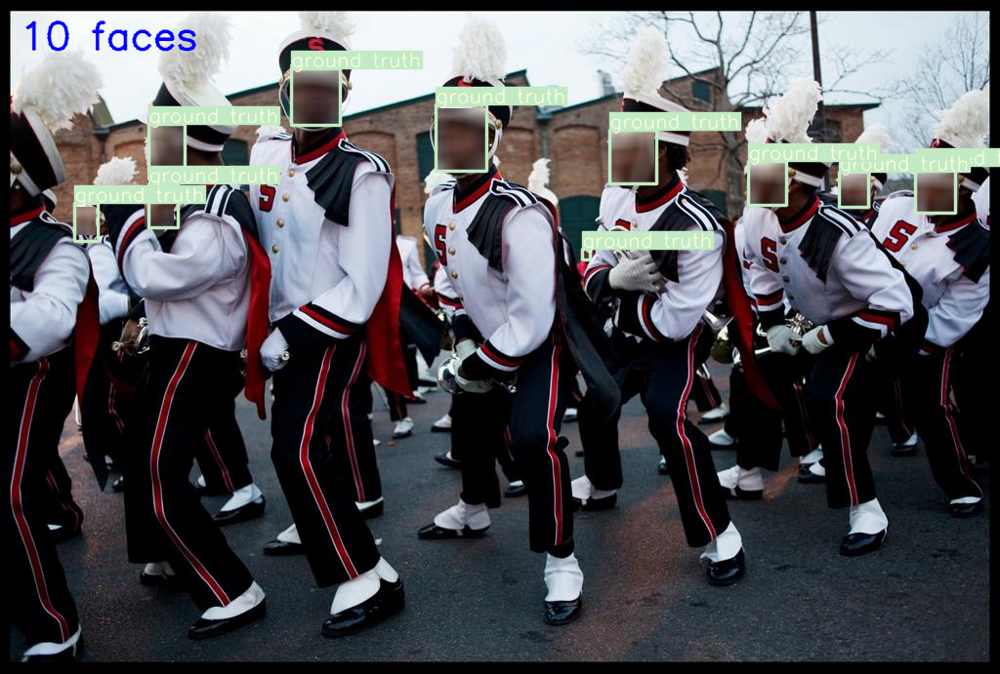

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='blur',
    bbox_type='xyxy',
    blur_kernel_size=(21, 21),
    blur_sigma_x=255,
    blur_sigma_y=255
)
yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


image_filepath = f"{ref_path}/yolov7/train/images/0_Parade_marchingband_1_417.jpg"


ground_truth = []
img_width, img_height = imagesize.get(image_filepath)
with open(image_filepath.replace("/images/", "/labels/").replace(".jpg", ".txt"), 'r') as f:
    for line in f:
        ground_truth.append(
            xywhn2xyxy(
                np.array(line.replace('\n', '').split(' ')[1:]).reshape(1,-1).astype(float),
                w=img_width, h=img_height
            ).astype(int).tolist()[0]
        )

output_img = yolo_model.predict_img(image_filepath, bboxes=ground_truth)

### 6.3.4. Block

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


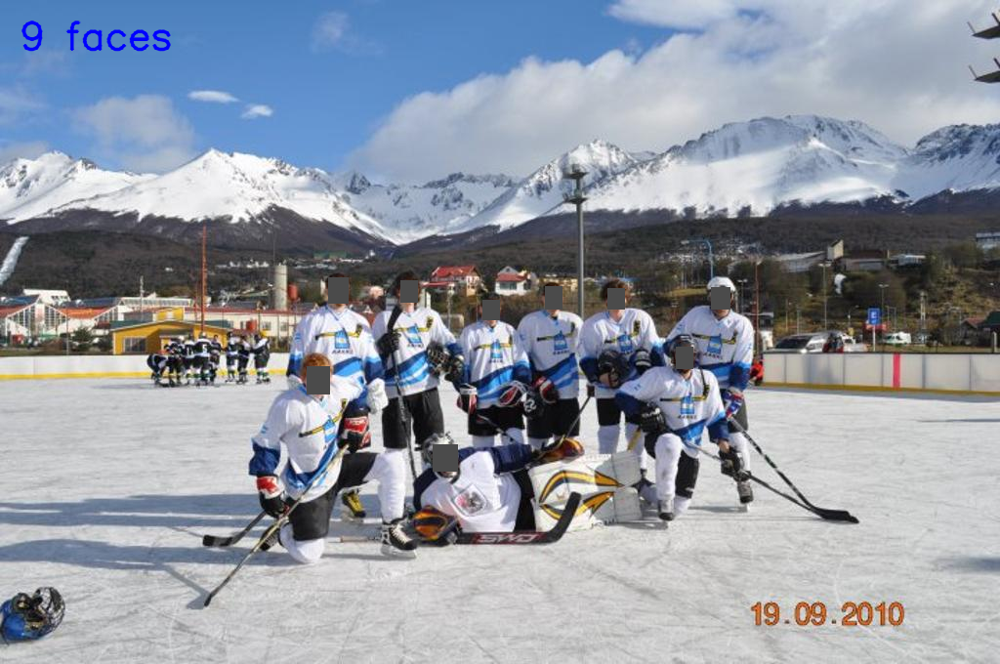

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='block',
    bbox_type='xyxy',
    block_intensity=75
)

yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)

output_img = yolo_model.predict_img(f"{ref_path}/yolov7/test/images/58_Hockey_icehockey_puck_58_373.jpg")

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


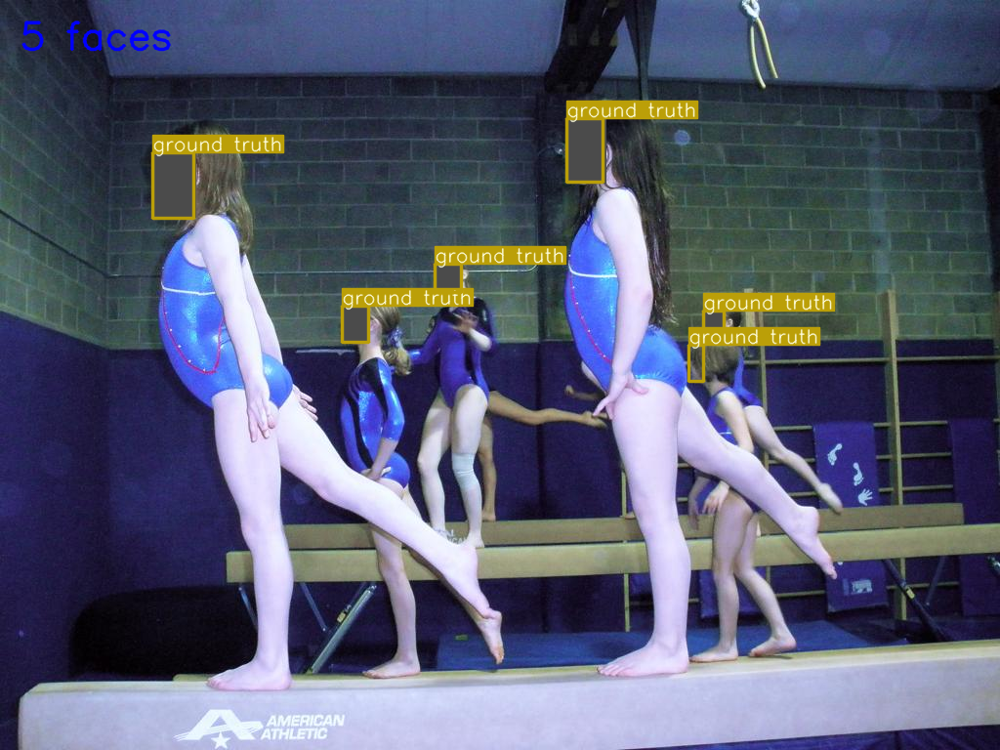

In [ ]:
face_anonymizer = FaceAnonymizer(
    method='block',
    bbox_type='xyxy',
    block_intensity=75
)
yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


image_filepath = f"{ref_path}/yolov7/train/images/40_Gymnastics_Gymnastics_40_330.jpg"


ground_truth = []
img_width, img_height = imagesize.get(image_filepath)
with open(image_filepath.replace("/images/", "/labels/").replace(".jpg", ".txt"), 'r') as f:
    for line in f:
        ground_truth.append(
            xywhn2xyxy(
                np.array(line.replace('\n', '').split(' ')[1:]).reshape(1,-1).astype(float),
                w=img_width, h=img_height
            ).astype(int).tolist()[0]
        )

output_img = yolo_model.predict_img(image_filepath, bboxes=ground_truth)

## 6.4. Inference on video

### 6.4.1. Sample

In [ ]:
from google.colab import files


# Detection action
det_action = "anon"     # "bbox" or "anon"
anon_method = "block"   # "blur", "pixelate", or "block"

# Path of the input video 
video_path = f"{ref_path}/yolov7/test/View of people walking through a crowded street in Mumbai.mp4"

# Path of the output video
save_path = video_path.split('/')
save_path[-1] = save_path[-1][:-4] + '_output' + f'_anon_{anon_method}'*(det_action=='anon') + save_path[-1][-4:]
save_path = '/'.join(save_path)

# Path of the compressed output video
compressed_path = save_path.replace('_output', '_output_compressed')
#-------------------------------------------------------------------------


# Initializing video object
video = cv2.VideoCapture(video_path)


#Video information
fps = video.get(cv2.CAP_PROP_FPS)
w = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
nframes = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialzing object for writing video output
output = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'DIVX'),fps , (w,h))
torch.cuda.empty_cache()
# Initializing model and setting it for inference
with torch.no_grad():
  weights, imgsz = opt['weights'], opt['img-size']
  set_logging()
  device = select_device(opt['device'])
  half = device.type != 'cpu'
  model = attempt_load(weights, map_location=device)  # load FP32 model
  stride = int(model.stride.max())  # model stride
  imgsz = check_img_size(imgsz, s=stride)  # check img_size
  if half:
    model.half()

  names = model.module.names if hasattr(model, 'module') else model.names
  colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]
  if device.type != 'cpu':
    model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))

  classes = None
  if opt['classes']:
    classes = []
    for class_name in opt['classes']:

      classes.append(names.index(class_name))

  if classes:
    
    classes = [i for i in range(len(names)) if i not in classes]

  for j in range(nframes):

      ret, img0 = video.read()
      
      if ret:
        img = letterbox(img0, imgsz, stride=stride)[0]
        img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
        img = np.ascontiguousarray(img)
        img = torch.from_numpy(img).to(device)
        img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
          img = img.unsqueeze(0)

        # Inference
        t1 = time_synchronized()
        pred = model(img, augment= False)[0]

        
        pred = non_max_suppression(pred, opt['conf-thres'], opt['iou-thres'], classes=classes, agnostic= False)
        t2 = time_synchronized()
        for i, det in enumerate(pred):
          s = ''
          s += '%gx%g ' % img.shape[2:]  # print string
          gn = torch.tensor(img0.shape)[[1, 0, 1, 0]]
          if len(det):
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], img0.shape).round()

            for c in det[:, -1].unique():
              n = (det[:, -1] == c).sum()  # detections per class
              s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string
    
            for *xyxy, conf, cls in reversed(det):
              if det_action == 'bbox':
                label = f'{names[int(cls)]} {conf:.2f}'
                plot_one_box(xyxy, img0, label=label, color=colors[int(cls)], line_thickness=3)
              else:
                img0 = anonymize(img0, faces=[xyxy], bbox_type='xyxy', method=anon_method)
        
        print(f"{j+1}/{nframes} frames processed")
        output.write(img0)
      else:
        break
    

output.release()
video.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os


os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(save_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

### 6.4.2. Predict on test videos

In [ ]:
anonymization_method = 'pixelate'

face_anonymizer = FaceAnonymizer(
    method=anonymization_method,
    bbox_type='xyxy',
    pixelate_type='dynamic',
    pixelate_ratio=15
)

yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


for root, dirs, files in os.walk(f"{ref_path}/yolov7/Test Videos"):
    for file in files:
        if file.endswith(".mp4") and "anonymize" not in file:
            filepath = os.path.join(root, file)

            filepath_parts = filepath.split(".")
            filepath_parts[-2] += f"-anonymized-yolov750-{anonymization_method}"
            output_filepath = ".".join(filepath_parts)
            yolo_model.predict_video(filepath, output_filepath)
            print(f"\n--> Processed '{os.path.basename(filepath)}' \n")
        

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]



--> Processed 'VIRAT_S_010205_02_000301_000345.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'VIRAT_S_050204_00_000000_000066.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv 2.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'People walk down the street outside Shinjuku station in the rain.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Fans in the stadium during the game. 

In [ ]:
anonymization_method = 'block'

face_anonymizer = FaceAnonymizer(
    method=anonymization_method,
    bbox_type='xyxy',
    block_intensity=0
)

yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


for root, dirs, files in os.walk(f"{ref_path}/yolov7/Test Videos"):
    for file in files:
        if file.endswith(".mp4") and "anonymize" not in file:
            filepath = os.path.join(root, file)

            filepath_parts = filepath.split(".")
            filepath_parts[-2] += f"-anonymized-yolov750-{anonymization_method}"
            output_filepath = ".".join(filepath_parts)
            yolo_model.predict_video(filepath, output_filepath)
            print(f"\n--> Processed '{os.path.basename(filepath)}' \n")
        

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'VIRAT_S_010205_02_000301_000345.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'VIRAT_S_050204_00_000000_000066.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv 2.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'People walk down the street outside Shinjuku station in the rain.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.f

In [ ]:
anonymization_method = 'blur'

face_anonymizer = FaceAnonymizer(
    method='blur',
    bbox_type='xyxy',
    blur_kernel_size=(21, 21),
    blur_sigma_x=120,
    blur_sigma_y=120
)

yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)


for root, dirs, files in os.walk(f"{ref_path}/yolov7/Test Videos"):
    for file in files:
        if file.endswith(".mp4") and "anonymize" not in file:
            filepath = os.path.join(root, file)

            filepath_parts = filepath.split(".")
            filepath_parts[-2] += f"-anonymized-yolov750-{anonymization_method}"
            output_filepath = ".".join(filepath_parts)
            yolo_model.predict_video(filepath, output_filepath)
            print(f"\n--> Processed '{os.path.basename(filepath)}' \n")
        

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'VIRAT_S_010205_02_000301_000345.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'VIRAT_S_050204_00_000000_000066.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'Professor is giving a lecture in the audience to students at university. Kyiv 2.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse

--> Processed 'People walk down the street outside Shinjuku station in the rain.mp4' 

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.f

### 6.4.3. Predict on webcam video



In [ ]:
face_anonymizer = FaceAnonymizer(
    method='block',
    block_intensity=25
)

yolo_model = YOLOv7Face(configs=model_configs, anonymizer=face_anonymizer)

yolo_model.predict_webcam()

<IPython.core.display.Javascript object>

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
